In [22]:
%pylab inline
import os
from qcodes import (
    experiments,
    initialise_database,
    initialise_or_create_database_at,
    load_by_guid,
    load_by_run_spec,
    load_experiment,
    load_by_counter,
    load_last_experiment,
    load_or_create_experiment,
)
from qcodes.dataset.plotting import plot_dataset
from qcodes.interactive_widget import experiments_widget
#from save_csv_files import export_all_datasets, save_to_csv
# from database_exploration import load_experiments, load_dataset, get_number_from_filename, print_labels, line_cut, print_sample_name, load_2d_data, plot_2d_data
# matplotlib.style.use('dark_background')
matplotlib.style.use('default')
font = {'size'   : 18}
matplotlib.rc('font', **font)
plt.rcParams['svg.fonttype'] = 'none'
matplotlib.rcParams['lines.linewidth'] = 1.6
matplotlib.rcParams['figure.max_open_warning'] = False
matplotlib.rcParams['xtick.direction'] = 'in'
matplotlib.rcParams['ytick.direction'] = 'in'
matplotlib.rcParams['ytick.major.width'] = 1.25
matplotlib.rcParams['xtick.major.width'] = 1.25
matplotlib.rcParams['ytick.major.size'] = 3.25
matplotlib.rcParams['xtick.major.size'] = 3.25
matplotlib.rcParams['ytick.minor.size'] = 3
matplotlib.rcParams['xtick.minor.size'] = 3
matplotlib.rcParams['ytick.minor.width'] = 1.5
matplotlib.rcParams['xtick.minor.width'] = 1.5
matplotlib.rcParams['axes.linewidth'] = 1.6
matplotlib.rcParams['axes.labelsize'] = 18
plt.rcParams['image.cmap'] = 'Spectral_r'

import matplotlib.colors as colors
import matplotlib.transforms as mtransforms
#print(matplotlib.rcParams.keys())
from scipy.interpolate import interp1d
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from scipy.optimize import least_squares
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm, LinearSegmentedColormap
from matplotlib import cm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import h5py

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [23]:
ee = 1.602e-19 #C
epsilon_0 = 8.8541878128e-21 #F/nm
k = 3.5 #BN dielectric constant
a = 0.246 #nm, graphene lattice constant
Phi_0 = 2068.0*2 # h/e, nm^2*T

def nD_to_V(n, D, Ct, Cb, n0 = 0):
    Vt = 1/(2*Ct)*(ee/1e2*(n-n0)+2*epsilon_0*D)
    Vb = 1/(2*Cb)*(ee/1e2*(n-n0)-2*epsilon_0*D)
    return Vt, Vb

def V_to_nD(Vtg, Vbg, Ct, Cb, n0 = 0):
    n = (Vtg*Ct+Vbg*Cb)/ee*1e2 + n0
    D = (Vtg*Ct-Vbg*Cb)/(2*epsilon_0)
    return n, D

def diophantine(V, t, s, m, Vs, V0):
    return 1/t*m*V-m/t*(s/4*Vs+V0)

def D_cut(x, y, Cx, Cy, D):
    x_min, x_max = min(x), max(x)
    y_min, y_max = min(y), max(y)
    
#     D = (Vtg*Ct-Vbg*Cb)/(2*epsilon_0)
    y1 = (D*2*epsilon_0 + x_min*Cx)/Cy
    y2 = (D*2*epsilon_0 + x_max*Cx)/Cy
    
    x1 = -(D*2*epsilon_0 - y_min*Cy)/Cx
    x2 = -(D*2*epsilon_0 - y_max*Cy)/Cx
    
    
    if y1 < y_min:
        x1, y1 = x1, y_min
    if y2 > y_max:
        x2, y2 = x2, y_max
    if x1 < x_min:
        x1, y1 = x_min, y1
    if x2 > x_max:
        x2, y2 = x_max, y2
    print('D: %.2f' %D)
    print('Vx: [%.4f, %.4f], Vy: [%.4f, %.4f]' %(x1, x2, y1, y2))
    return [x1, x2], [y1, y2]

def Lm(theta, a = a, delta = 1.8/100):
    # theta in degrees
    ret = (1+delta)*a/sqrt(2*(1+delta)*(1-cos(theta*pi/180))+delta**2)
    return ret

In [24]:
# t = 1.025
n_0 = -0.07
Ctop = 8.2265e-22
Cbottom = 14.35e-22

In [25]:
print(nD_to_V(3, -0.1, Ctop, Cbottom, n0 = n_0))

(1.9129049033246215, 2.3306542029825783)


In [26]:
database = h5py.File('./dat840.h5', 'r')

In [68]:
database  = ( './AO_RG_11.db', 'r')

In [69]:
list(database.keys())

AttributeError: 'tuple' object has no attribute 'keys'

In [28]:
# plot 2D gate map

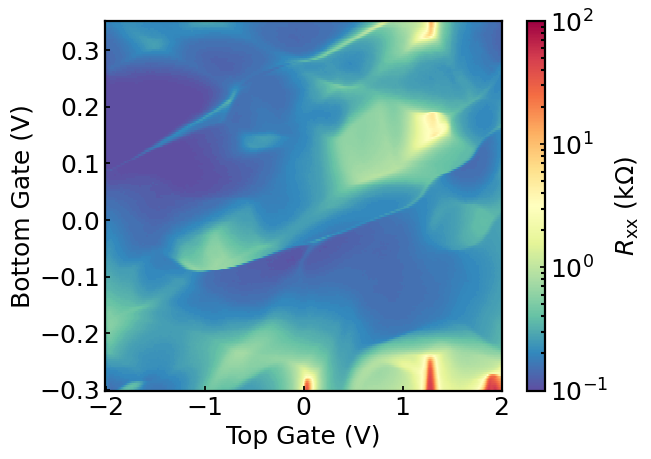

In [36]:
r_cd_x_2d = np.array(database['v_cd_x_2d'])/1000/1e-9/1e3
# print(r_hg_x_2D[0])

# plot 2D gate map

slow_gate = np.linspace(-2, 2, num = 400)
fast_gate = np.linspace(-0.3, 0.35, num = 200)

xv, yv = np.meshgrid(slow_gate,fast_gate)

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Bottom Gate (V)')

c = ax.pcolormesh(xv, yv, r_cd_x_2d, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# fname = './2D_map_T=8mk/ggmap_bgslow-6to6_tgfast-9to9.png'
# plt.savefig(fname, bbox_inches = 'tight')

In [8]:
#plot in nD space

8.2265e-22


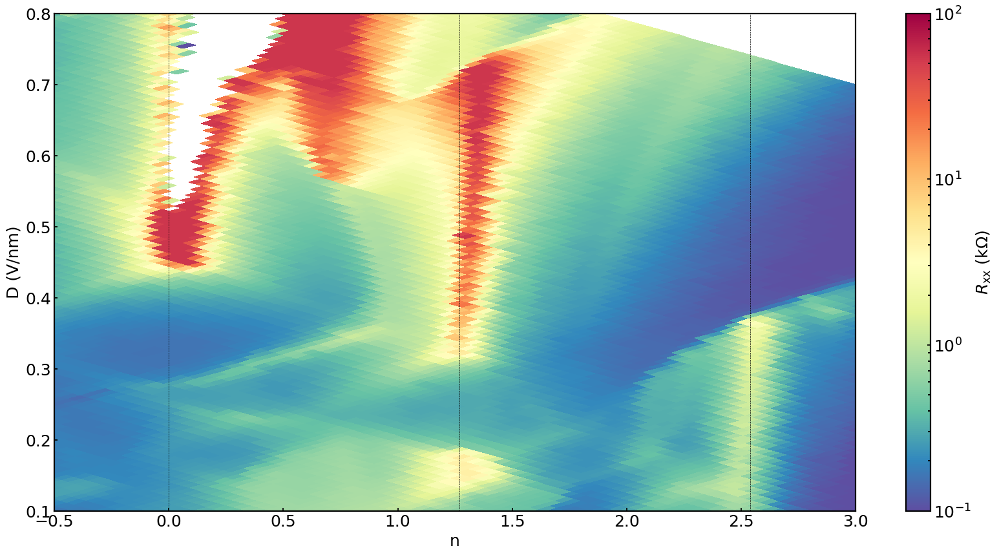

In [23]:
#V to n and D

print(Ctop)

fig, ax = plt.subplots(figsize=(20, 10))

n, D = V_to_nD(xv, yv, Ctop, Cbottom, n0 = n_0)

ax.set_xlabel('n')
ax.set_ylabel('D (V/nm)')

ax.set_xlim(-0.5, 3)
ax.set_ylim(0.1, 0.8)

c = ax.pcolormesh(n, -1*D, r_hg_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)



fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

In [ ]:
#rxy 2D gate map

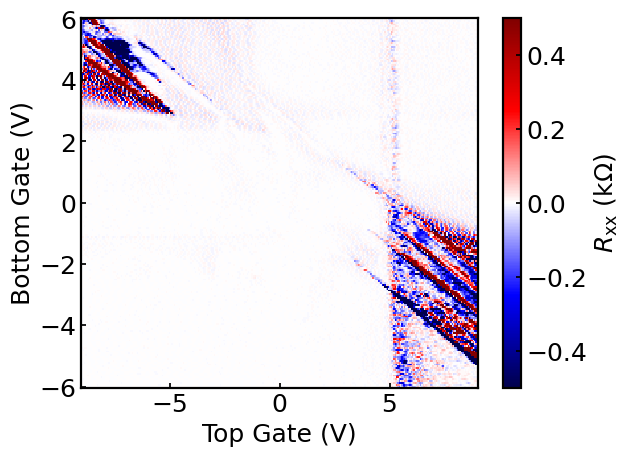

In [61]:
r_ib_x_2D = np.array(database['v_ib_x_2d'])/1000/1e-9/1e3
# print(r_ib_x_2D[0])

# plot 2D gate map

slow_gate = np.linspace(-6, 6, num = 200)
fast_gate = np.linspace(-9, 9, num = 300)

xv, yv = np.meshgrid(fast_gate, slow_gate)

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Bottom Gate (V)')

c = ax.pcolormesh(xv, yv, r_ib_x_2D, cmap = 'seismic', vmin = -0.5, vmax = 0.5)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

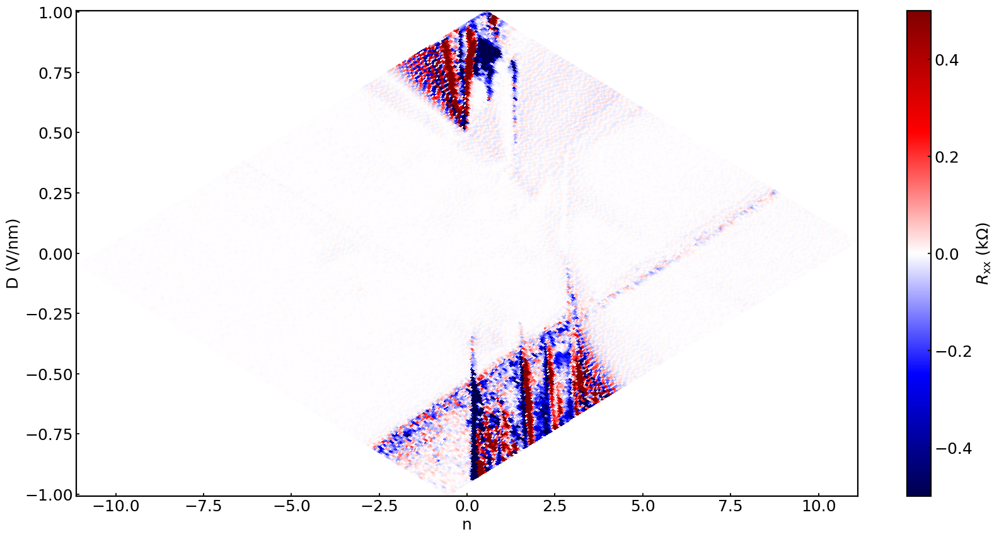

In [65]:
#plot in nD space

Ctop = k*epsilon_0/33
Cbottom = k*epsilon_0/20

fig, ax = plt.subplots(figsize=(20, 10))

n, D = V_to_nD(xv, yv, Ctop, Cbottom, n0 = 0)

ax.set_xlabel('n')
ax.set_ylabel('D (V/nm)')

c = ax.pcolormesh(n, -1*D, r_ib_x_2D, cmap = 'seismic', vmin = -0.5, vmax = 0.5)

fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

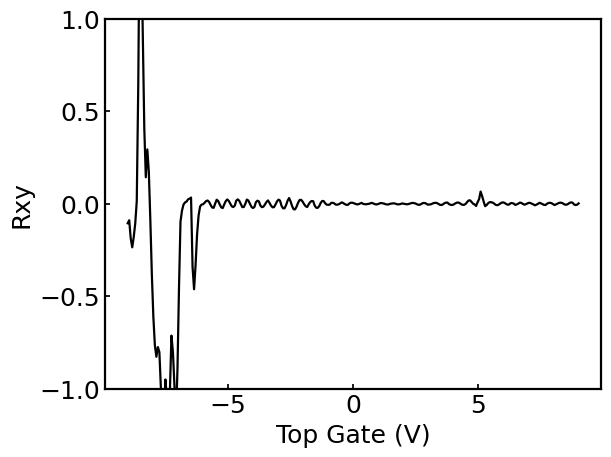

In [56]:
#1D line cut through rxy plateau region

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Rxy')

ax.set_ylim(-1, 1)

ax.plot(fast_gate, r_ib_x_2D[186], 'k-')
# print(r_ib_x_2D[186][10])

In [ ]:
#Capacitance Calibration Landau Fan Analysis

In [5]:
database = h5py.File('./Capactitance_Calibration_landaufans/BG_fan/dat11.h5', 'r')
list(database.keys())

['bkraw_2d',
 'metadata',
 'tkraw_2d',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d',
 'v_ih_x_2d',
 'v_ih_y_2d']

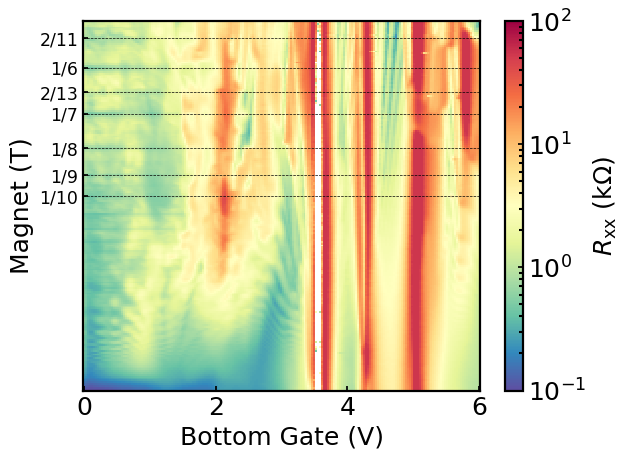

In [12]:
#plot Landau Fan, Rxx
r_hg_x_2D = np.array(database['v_hg_x_2d'])/1000/1e-9/1e3
# print(r_hg_x_2D[0])

# plot 2D gate map

magnet = np.linspace(5, 0, num = 200)
fast_gate = np.linspace(0, 6, num = 200)

xv, yv = np.meshgrid(fast_gate, magnet)

fig, ax = plt.subplots()

ax.set_xlabel('Bottom Gate (V)')
ax.set_ylabel('Magnet (T)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

#Brown Zac oscillations:

ns = 2.54e16
Phi_0 = 4.136e-15

F1 = (ns*Phi_0/4)*(1/8)
F2 = (ns*Phi_0/4)*(1/10)
F3 = (ns*Phi_0/4)*(1/6)
F4 = (ns*Phi_0/4)*(1/7)
F5 = (ns*Phi_0/4)*(1/9)
F6 = (ns*Phi_0/4)*(2/11)
F7 = (ns*Phi_0/4)*(2/13)

ax.axhline(F1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(F2, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(F3, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(F4, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(F5, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(F6, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(F7, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_yticks([F1, F2, F3, F4, F5, F6, F7], ["1/8", "1/10", "1/6", "1/7", "1/9", "2/11", "2/13"], size = 'x-small')


# fname = './Capactitance_Calibration_landaufans/BG_fan/landauFan_tg-6V_BG0to6V_SG0V_1nA_B5to0T.png'
# plt.savefig(fname, bbox_inches = 'tight')

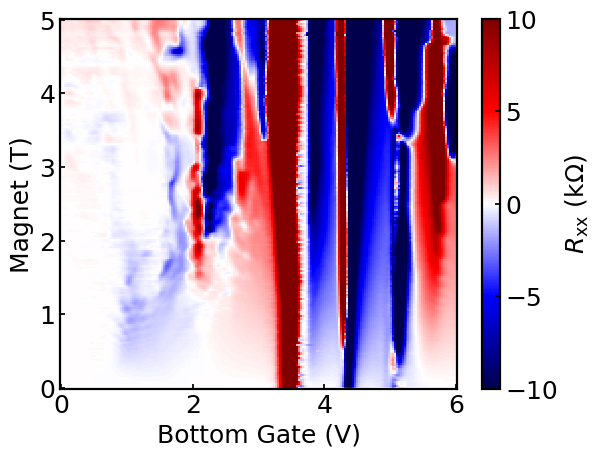

In [13]:
#plot Landau Fan, Rxy
r_gd_x_2D = np.array(database['v_gd_x_2d'])/1000/1e-9/1e3
# print(r_hg_x_2D[0])

# plot 2D gate map

magnet = np.linspace(5, 0, num = 200)
fast_gate = np.linspace(0, 6, num = 200)

xv, yv = np.meshgrid(fast_gate, magnet)

fig, ax = plt.subplots()

ax.set_xlabel('Bottom Gate (V)')
ax.set_ylabel('Magnet (T)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -1e1, vmax = 1e1)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# fname = './Capactitance_Calibration_landaufans/BG_fan/landauFan_tg-6V_BG0to6V_SG0V_1nA_B5to0T.png'
# plt.savefig(fname, bbox_inches = 'tight')

In [14]:
lm1 = np.sqrt(8/(np.sqrt(3)*2.3e16))*1e9
#theta in radians
theta = 0
delta = 0.017
a = 0.246

print(ns)

numerator = ((1 + delta) * a)
denominator = np.sqrt((2 * (1 + delta) * (1 - np.cos(theta))) + delta**2)

lm2 = numerator/denominator

print(lm1)
print(lm2)

2.54e+16
14.171008606853714
14.716588235294115


In [15]:
#2D map at 1T

In [6]:
database = h5py.File('./2D_map_B=1T/dat12.h5', 'r')
list(database.keys())

['bkraw_2d',
 'metadata',
 'tkraw_2d',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d',
 'v_ih_x_2d',
 'v_ih_y_2d']

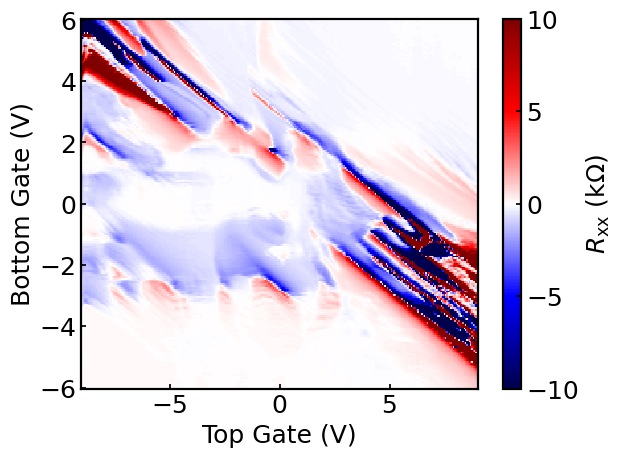

In [7]:
r_gd_x_2D_pos1 = np.array(database['v_gd_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_gate = np.linspace(-6, 6, num = 200)
fast_gate = np.linspace(-9, 9, num = 300)

xv, yv = np.meshgrid(fast_gate, slow_gate)

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Bottom Gate (V)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D_pos1, cmap = 'seismic', vmin = -10, vmax = 10)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

In [533]:
#2D map at -1T

In [8]:
database = h5py.File('./2D_map_B=-1T/dat13.h5', 'r')
list(database.keys())

['bkraw_2d',
 'metadata',
 'tkraw_2d',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d',
 'v_ih_x_2d',
 'v_ih_y_2d']

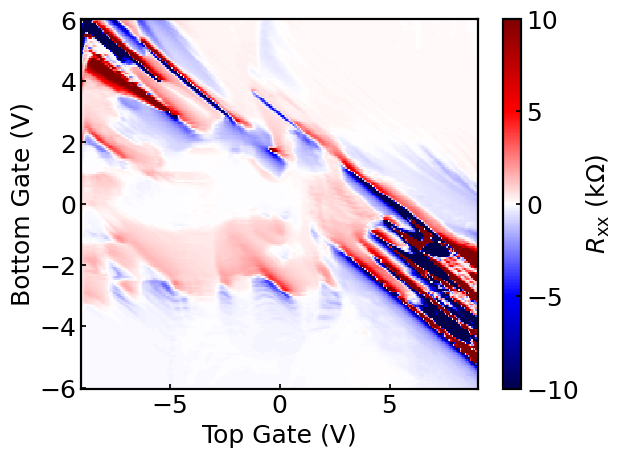

In [9]:
r_gd_x_2D_neg1 = np.array(database['v_gd_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_gate = np.linspace(-6, 6, num = 200)
fast_gate = np.linspace(-9, 9, num = 300)

xv, yv = np.meshgrid(fast_gate, slow_gate)

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Bottom Gate (V)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D_neg1, cmap = 'seismic', vmin = -10, vmax = 10)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

In [536]:
#Antisymmetrized map

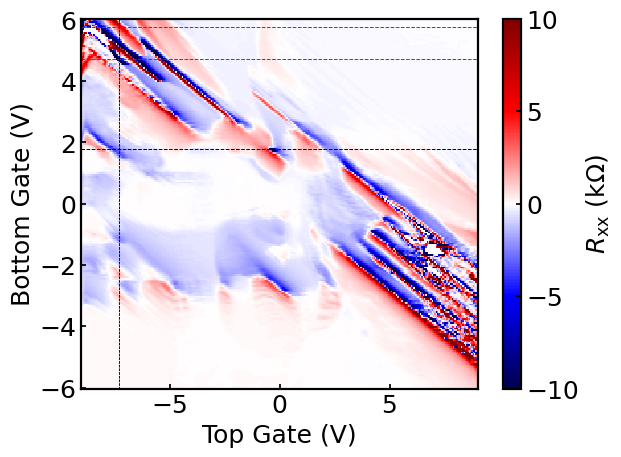

In [10]:
r_gd_x_2D_antisym = (r_gd_x_2D_pos1 - r_gd_x_2D_neg1)/2

# plot 2D gate map

slow_gate = np.linspace(-6, 6, num = 200)
fast_gate = np.linspace(-9, 9, num = 300)

xv, yv = np.meshgrid(fast_gate, slow_gate)

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Bottom Gate (V)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -10, vmax = 10)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axhline(slow_gate[178], 0, 1, c = 'r', linestyle = '--', linewidth = 0.7)
ax.axvline(-7.3, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.axhline(slow_gate[195], 0, 1, c = 'g', linestyle = '--', linewidth = 0.7)
ax.axvline(-7.3, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

# ax.axhline(slow_gate[191], 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.axhline(slow_gate[129], 0, 1, c = 'k', linestyle = '--', linewidth = 0.7)

fname = './2D_map_antisym_B+-1T/antisym2Dmap_Vt-9to9fast_Vb-6to6slow_sg0V.png'
plt.savefig(fname, bbox_inches = 'tight')

8.2265e-22


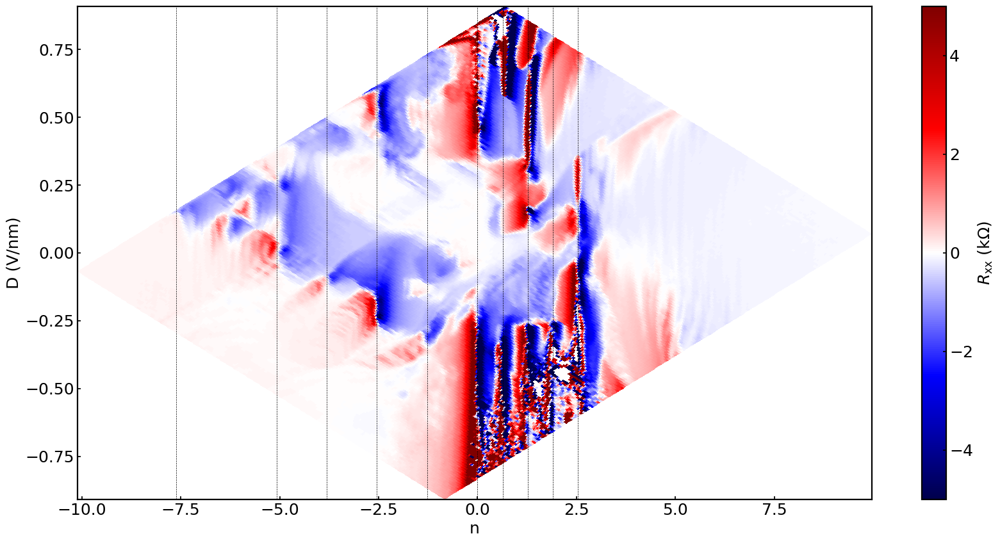

In [45]:
#plot in nD space

fig, ax = plt.subplots(figsize=(20, 10))
print(Ctop)

n, D = V_to_nD(xv, yv, Ctop, Cbottom, n0 = n_0)

ff = 2.54
v = (n/ff)*4

ax.set_xlabel('n')
ax.set_ylabel('D (V/nm)')
# ax.set_xlim(-5, 5)
# ax2 = ax.twiny()
# ax2.set_xlim(-5, 5)
# ax2.set_xlabel('v, using v = 4 with n = 2.54')
# ax2.set_xticks([-10, -8, -6, -4, -2, 0, 1, 2, 3, 4])

c = ax.pcolormesh(n, -1*D, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -5, vmax = 5)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')
ax.axvline(0, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax2.pcolormesh(v, -1*D, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -5, vmax = 5)
# ax.axvline(2.54, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.axvline(2.54, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(2.54/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(2.54/4, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(2.54*(3/4), 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(-2.54, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(-2.54*2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(-2.54*3, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(-2.54/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(-2.54*(3/2), 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axvline(2.54*(3/4), 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax2.axvline(-4, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax2.axvline(-2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax2.axvline(-8, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax2.axvline(-6, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax2.axvline(-10, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axvline(1.95, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axvline(1.27, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axvline(1.36, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axhline(0.6, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

# ax.axhline(0.154, -1.25/10  c = 'k', linestyle = '--', linewidth = 0.5)

#ax2.axhline(-0.12, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axhline(0.85, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)


# fname = './2D_map_antisym_B+-1T/antisym2Dmap_Vt-9to9fast_Vb-6to6slow_sg0V_nD_fullfilling2p54_vlinesshown.png'
# plt.savefig(fname, bbox_inches = 'tight')

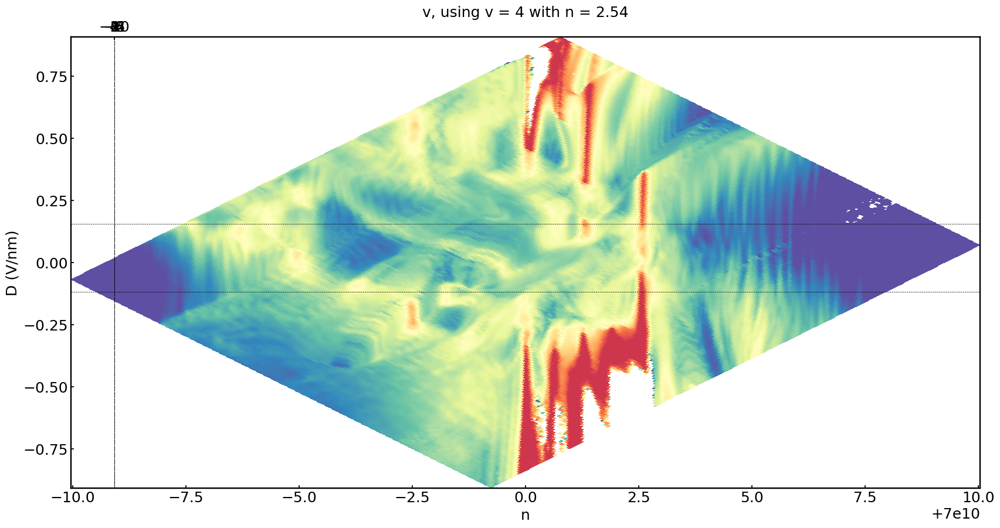

In [19]:
#plot in nD space

r_hg_x_2D = np.array(database['v_hg_x_2d'])/1000/1e-9/1e3

fig, ax = plt.subplots(figsize=(20, 10))

n, D = V_to_nD(xv, yv, Ctop, Cbottom, n0 = n_0)

ff = 2.54
v = (n/ff)*4

ax.set_xlabel('n')
ax.set_ylabel('D (V/nm)')
ax2 = ax.twiny()
ax2.set_xlabel('v, using v = 4 with n = 2.54')
ax2.set_xticks([-10, -8, -6, -4, -2, 0, 1, 2, 3, 4])

c = ax.pcolormesh(n, -1*D, r_hg_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
ax2.axvline(0, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.pcolormesh(v, -1*D, r_hg_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
# ax.axvline(2.54, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax2.axvline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(3, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(4, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(-4, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(-2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(-8, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(-6, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(-10, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axvline(1.95, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axvline(1.27, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axvline(1.36, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axhline(0.6, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

ax2.axhline(0.154, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axhline(-0.12, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axhline(0.85, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

# fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# fname = './2D_map_antisym_B+-1T/antisym2Dmap_Vt-9to9fast_Vb-6to6slow_sg0V_nD_fullfilling2p54_vlinesshown.png'
# plt.savefig(fname, bbox_inches = 'tight')

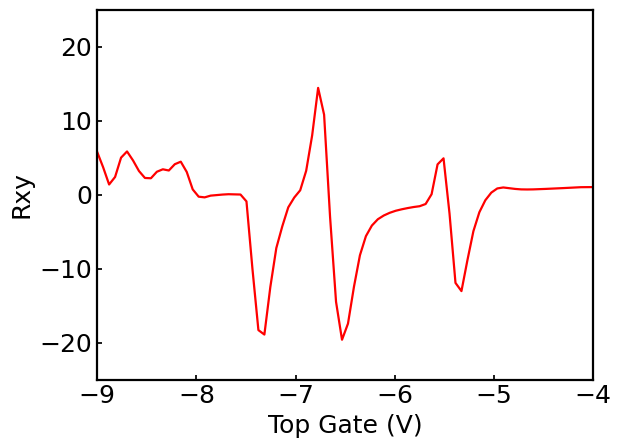

In [217]:
#1D line cut through rxy plateau region

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Rxy')

ax.set_ylim(-25, 25)
ax.set_xlim(-9, -4)

ax.plot(fast_gate, r_gd_x_2D_antisym[178], 'r-')
# print(r_ib_x_2D[186][10])

fname = './2D_map_antisym_B+-1T/antisym2Dmap_Vt-9to9fast_Vb-6to6slow_sg0V_linecutred.png'
plt.savefig(fname, bbox_inches = 'tight')

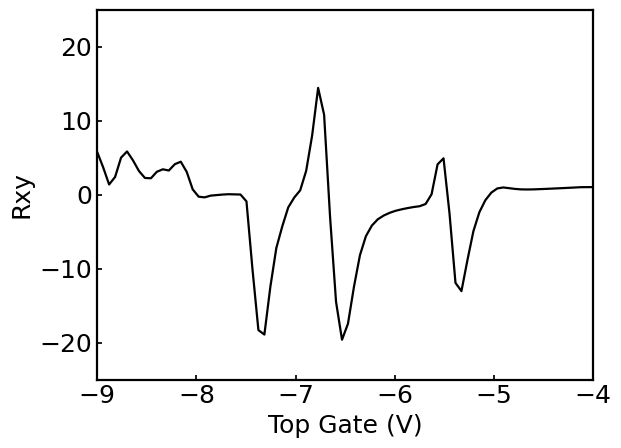

In [126]:
#1D line cut through rxy plateau region

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Rxy')

ax.set_ylim(-25, 25)
ax.set_xlim(-9, -4)

ax.plot(fast_gate, r_gd_x_2D_antisym[178], 'k-')
# print(r_ib_x_2D[186][10])

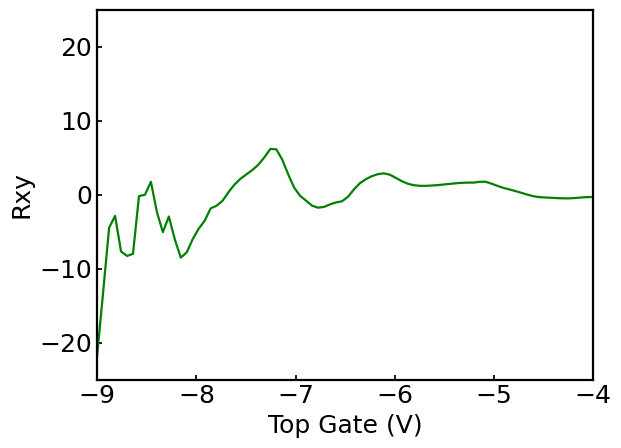

In [127]:
#1D line cut through rxy plateau region

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Rxy')

ax.set_ylim(-25, 25)
ax.set_xlim(-9, -4)

ax.plot(fast_gate, r_gd_x_2D_antisym[195], 'g-')
# print(r_ib_x_2D[186][10])

fname = './2D_map_antisym_B+-1T/antisym2Dmap_Vt-9to9fast_Vb-6to6slow_sg0V_linecutgreen.png'
plt.savefig(fname, bbox_inches = 'tight')

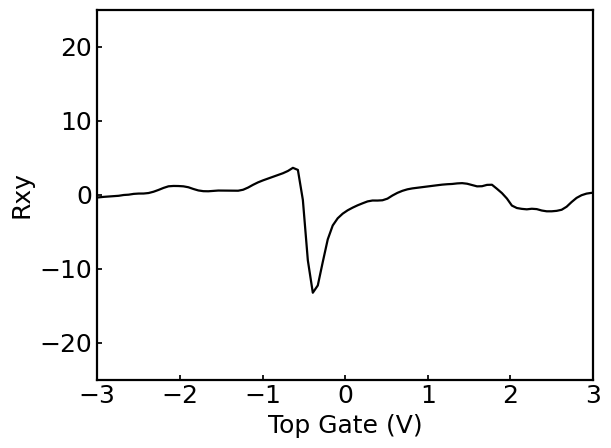

In [128]:
#1D line cut through rxy plateau region

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Rxy')

ax.set_ylim(-25, 25)
ax.set_xlim(-3, 3)

ax.plot(fast_gate, r_gd_x_2D_antisym[129], 'k-')
# print(r_ib_x_2D[186][10])

fname = './2D_map_antisym_B+-1T/antisym2Dmap_Vt-9to9fast_Vb-6to6slow_sg0V_linecutblack.png'
plt.savefig(fname, bbox_inches = 'tight')

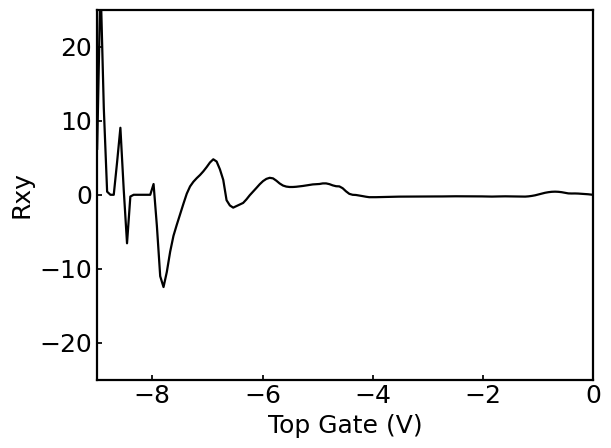

In [129]:
#1D line cut through rxy plateau region

fig, ax = plt.subplots()

ax.set_xlabel('Top Gate (V)')
ax.set_ylabel('Rxy')

ax.set_ylim(-25, 25)
ax.set_xlim(-9, 0)

ax.plot(fast_gate, r_gd_x_2D_antisym[191], 'k-')
# print(r_ib_x_2D[186][10])

In [130]:
print(nD_to_V(1.95, -0.85, Ctop, Cbottom, n0 = 0))

(-7.431078933054238, 6.491435457771428)


In [131]:
print(nD_to_V(0, -0.6, Ctop, Cbottom, n0 = 0))

(-6.619211163458304, 3.794651919771428)


In [ ]:
#nD map around v = 1, -0.2T

In [264]:
database = h5py.File('./2D_map_T=8mk_zoominaroundv=1_B=-0.2T/dat21.h5', 'r')
list(database.keys())

['bkraw_2d',
 'metadata',
 'tkraw_2d',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d',
 'v_ih_x_2d',
 'v_ih_y_2d']

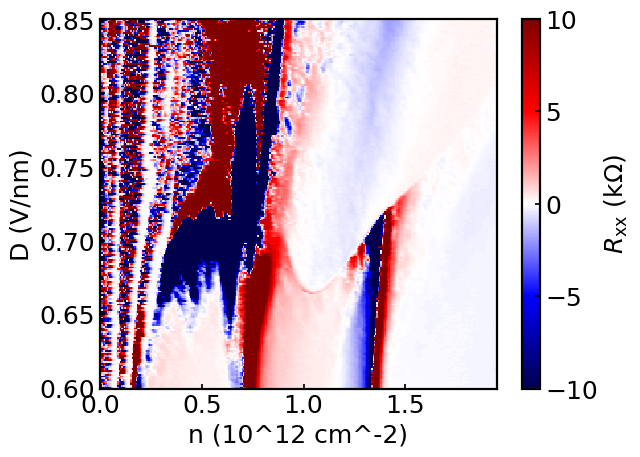

In [265]:
r_gd_x_2D_neg0p2 = np.array(database['v_gd_x_2d'])/1000/1e-10/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)

xv, yv = np.meshgrid(fast_n, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D_neg0p2, cmap = 'seismic', vmin = -10, vmax = 10)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

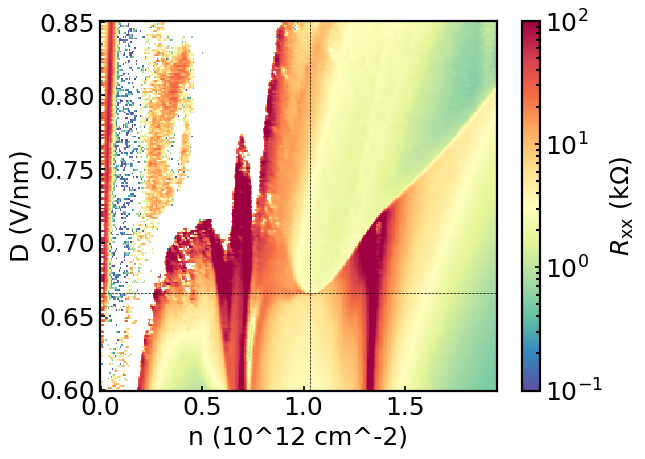

In [266]:
r_hg_x_2D_neg0p2 = np.array(database['v_hg_x_2d'])/1000/1e-10/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)


xv, yv = np.meshgrid(fast_n, slow_D)

fig, ax = plt.subplots()

ax.axvline(1.03, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(0.666, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

# ax.axvline(0.75, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axhline(0.65, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D_neg0p2, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

In [267]:
#nd map around v=1, 0.2T
database = h5py.File('./2D_map_T=8mk_zoominaroundv=1_B=0.2T/dat22.h5', 'r')
list(database.keys())

['bkraw_2d',
 'metadata',
 'tkraw_2d',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d',
 'v_ih_x_2d',
 'v_ih_y_2d']

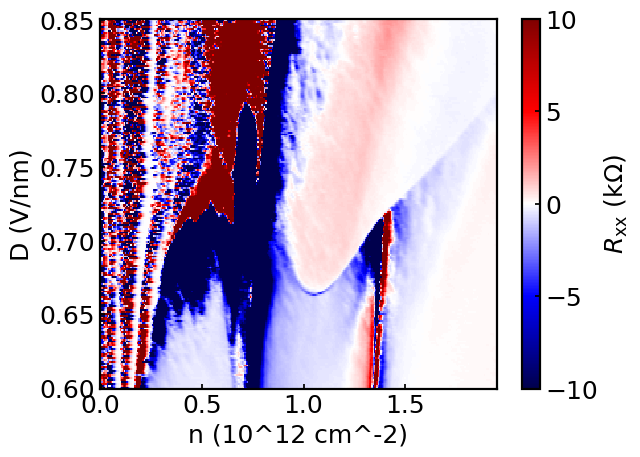

In [268]:
r_gd_x_2D_pos0p2 = np.array(database['v_gd_x_2d'])/1000/1e-10/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)

xv, yv = np.meshgrid(fast_n, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D_pos0p2, cmap = 'seismic', vmin = -10, vmax = 10)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

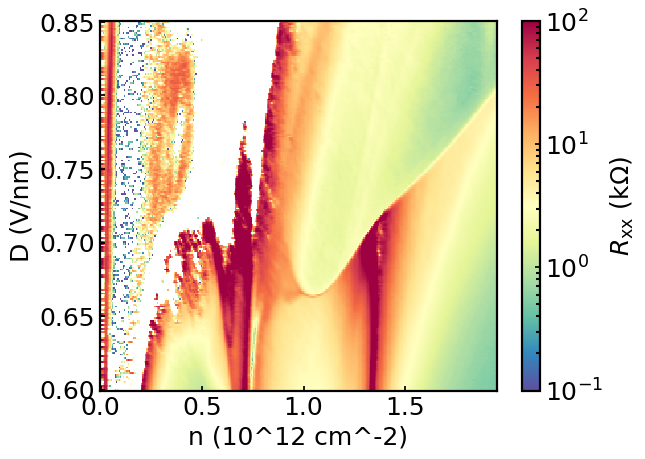

In [269]:
r_hg_x_2D_pos0p2 = np.array(database['v_hg_x_2d'])/1000/1e-10/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)

xv, yv = np.meshgrid(fast_n, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D_pos0p2, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

In [270]:
#symmetrized and antisymmetrized maps zoomed in around v=1

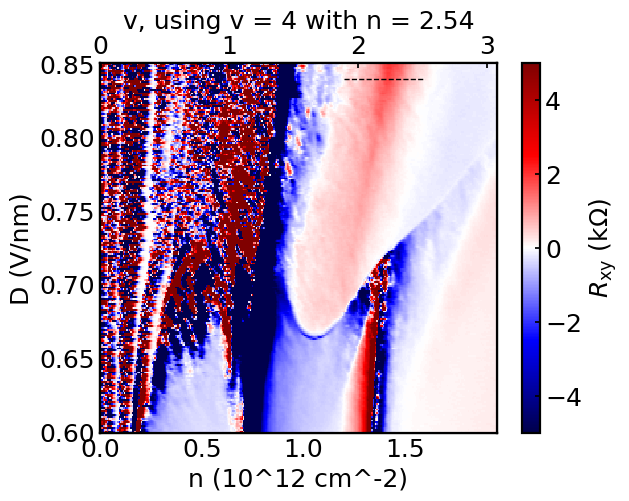

In [275]:
#antisymmetrized rxy, v = 1 assignment number 1

r_gd_x_2D_antisym = (r_gd_x_2D_pos0p2 - r_gd_x_2D_neg0p2)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.axvline(1.03, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(0.666, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')
ax2 = ax.twiny()
ax2.set_xlabel('v, using v = 4 with n = 2.54')

# ax2.axvline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax2.axvline(1.2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax2.axvline(2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axhline(0.84, 0.615,  0.82, c = 'k', linestyle = '--', linewidth = 1)

c = ax.pcolormesh(xv, yv, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -5, vmax = 5)

fig.colorbar(c, ax=ax, label = '$R_\mathrm{xy}\ \mathrm{(k\Omega)}$')
ax2.pcolormesh(xv_v, yv_v, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -5, vmax = 5)

fname = './LFatD=0p84/antisymnDmap_D0.6to0.85_n0to1.95_sg0V_nD_fullfillingassignment1.png'
plt.savefig(fname, bbox_inches = 'tight')

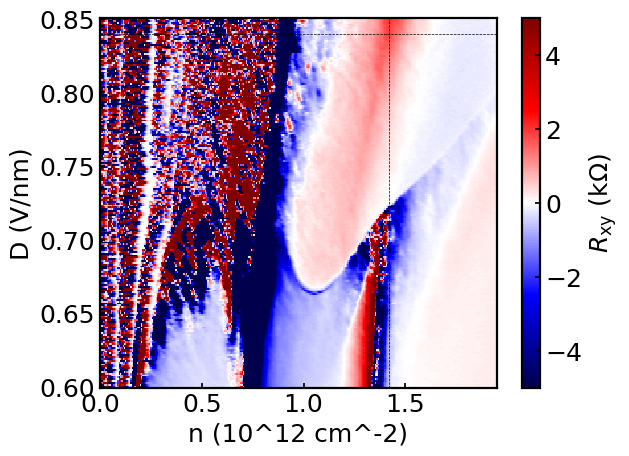

In [93]:
#antisymmetrized rxy, v = 1 assignment number 2

r_gd_x_2D_antisym = (r_gd_x_2D_pos0p2 - r_gd_x_2D_neg0p2)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)

ff = 2.7
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()
ax.axvline(1.42, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(0.84, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')
# ax2 = ax.twiny()
# ax2.set_xlabel('v, using v = 4 with n = 2.7')

# ax2.axvline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax2.axvline(2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

c = ax.pcolormesh(xv, yv, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -5, vmax = 5)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xy}\ \mathrm{(k\Omega)}$')
# ax2.pcolormesh(xv_v, yv_v, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -50, vmax = 50)

# fname = './nDmap_sym_antisym+-0p2T/antisymnDmap_D0.6to0.85_n0to1.95_sg0V_nD_fullfillingassignment2.png'
# plt.savefig(fname, bbox_inches = 'tight')

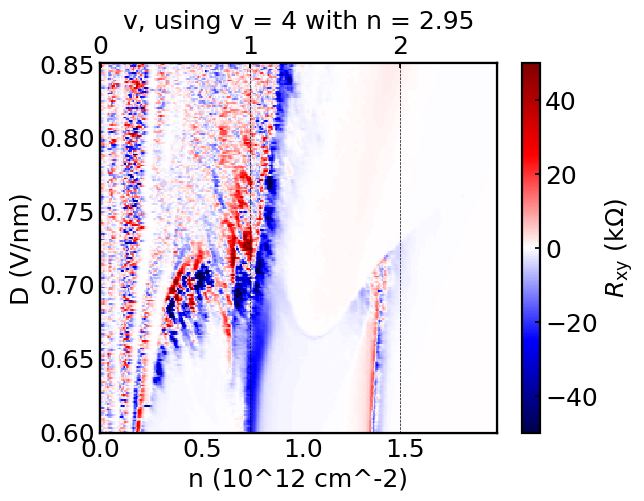

In [30]:
#antisymmetrized rxy, v = 1 assignment number 3

r_gd_x_2D_antisym = (r_gd_x_2D_pos0p2 - r_gd_x_2D_neg0p2)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)

ff = 2.95
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')
ax2 = ax.twiny()
ax2.set_xlabel('v, using v = 4 with n = 2.95')

ax2.axvline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

c = ax.pcolormesh(xv, yv, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -50, vmax = 50)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xy}\ \mathrm{(k\Omega)}$')
ax2.pcolormesh(xv_v, yv_v, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -50, vmax = 50)

fname = './nDmap_sym_antisym+-0p2T/antisymnDmap_D0.6to0.85_n0to1.95_sg0V_nD_fullfillingassignment3.png'
plt.savefig(fname, bbox_inches = 'tight')

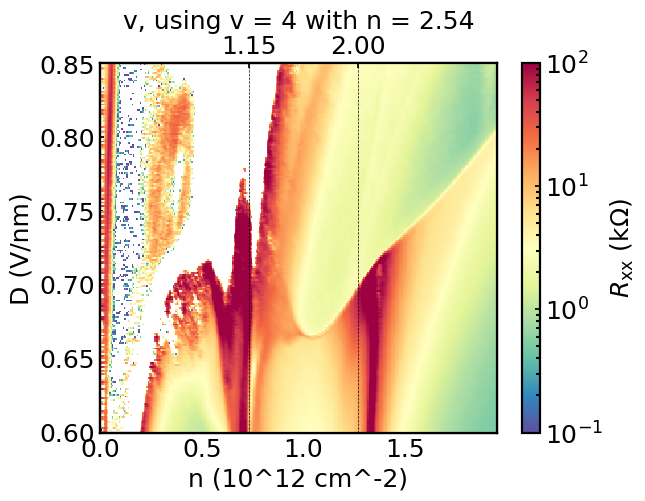

In [37]:
#symmetrized rxx, v = 1 assignment number 1

r_hg_x_2D_sym = (r_hg_x_2D_pos0p2 + r_hg_x_2D_neg0p2)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')
ax2 = ax.twiny()
ax2.set_xlabel('v, using v = 4 with n = 2.54')
ax2.set_xticks([1.15, 2])

# ax2.axvline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(1.15, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

c = ax.pcolormesh(xv, yv, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')
ax2.pcolormesh(xv_v, yv_v, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)

fname = './nDmap_sym_antisym+-0p2T/symnDmap_D0.6to0.85_n0to1.95_sg0V_nD_fullfillingassignment1.png'
plt.savefig(fname, bbox_inches = 'tight')

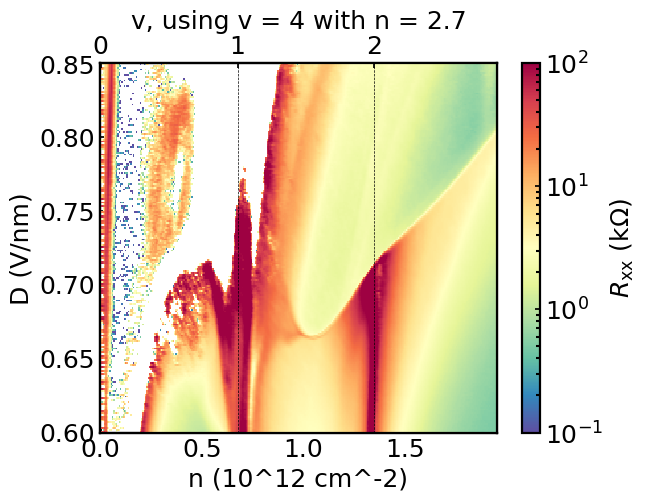

In [32]:
#symmetrized rxx, v = 1 assignment number 2

r_hg_x_2D_sym = (r_hg_x_2D_pos0p2 + r_hg_x_2D_neg0p2)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)

ff = 2.7
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')
ax2 = ax.twiny()
ax2.set_xlabel('v, using v = 4 with n = 2.7')

ax2.axvline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

c = ax.pcolormesh(xv, yv, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')
ax2.pcolormesh(xv_v, yv_v, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)

fname = './nDmap_sym_antisym+-0p2T/symnDmap_D0.6to0.85_n0to1.95_sg0V_nD_fullfillingassignment2.png'
plt.savefig(fname, bbox_inches = 'tight')

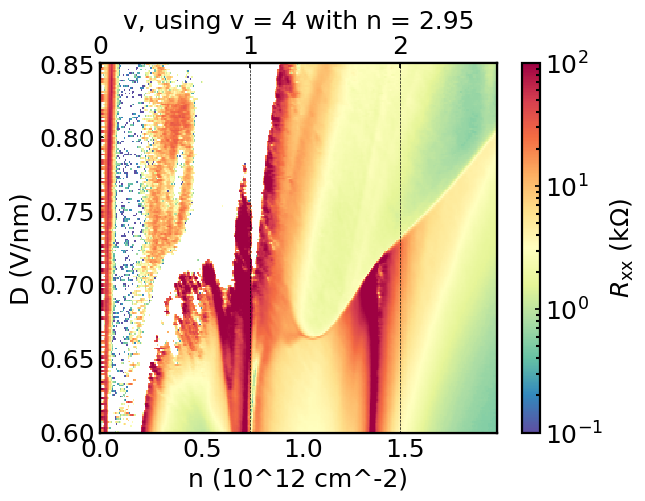

In [196]:
#symmetrized rxx, v = 1 assignment number 3

r_hg_x_2D_sym = (r_hg_x_2D_pos0p2 + r_hg_x_2D_neg0p2)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.6, 0.85, num = 200)
fast_n = np.linspace(0, 1.95, num = 300)

ff = 2.95
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('n (10^12 cm^-2)')
ax2 = ax.twiny()
ax2.set_xlabel('v, using v = 4 with n = 2.95')

ax2.axvline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax2.axvline(2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

c = ax.pcolormesh(xv, yv, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')
ax2.pcolormesh(xv_v, yv_v, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)

fname = './nDmap_sym_antisym+-0p2T/symnDmap_D0.6to0.85_n0to1.95_sg0V_nD_fullfillingassignment3.png'
plt.savefig(fname, bbox_inches = 'tight')

In [ ]:
#Landau fans through v = 1

In [427]:
database = []

for i in range(53, 254):
    database.append(h5py.File('./Lfthroughv=1/dat' + str(i) +'.h5', 'r'))
    
list(database[0].keys())

['metadata',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d',
 'v_ih_x_2d',
 'v_ih_y_2d']

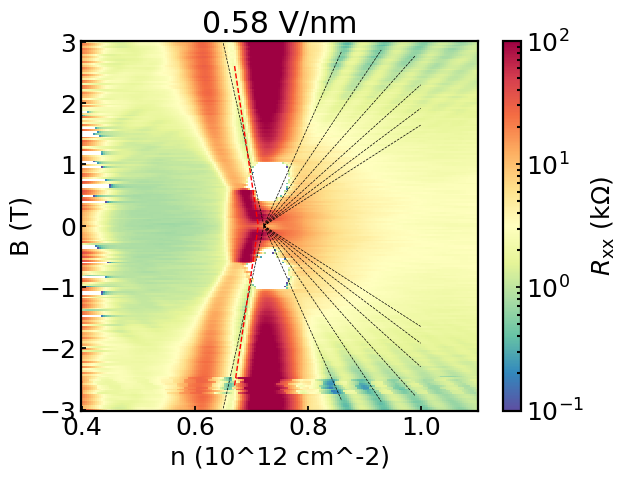

In [428]:
#plot Landau fan at 0.58V/nm, rxx

r_hg_x_2D = []
for i in range(0, len(database)):
    r_hg_x_2D.append(database[i]['v_hg_x_2d'][0]/1000/1e-10/1e3)
    
D = 0.58
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x3 = np.linspace(0.722, 0.86, 100)
y3 = (x3 - 0.722)*(Phi_0*1e-2)*(1/2)
x4 = np.linspace(0.722, 0.86, 100)
y4 = (x4 - 0.722)*(Phi_0*1e-2)*(-1/2)
x5 = np.linspace(0.722, 0.93, 100)
y5 = (x5 - 0.722)*(Phi_0*1e-2)*(1/3)
x6 = np.linspace(0.722, 0.93, 100)
y6 = (x6 - 0.722)*(Phi_0*1e-2)*(-1/3)
x7 = np.linspace(0.722, 0.99, 100)
y7 = (x7 - 0.722)*(Phi_0*1e-2)*(1/4)
x8 = np.linspace(0.722, 0.99, 100)
y8 = (x8 - 0.722)*(Phi_0*1e-2)*(-1/4)
x9 = np.linspace(0.722, 1.0, 100)
y9 = (x9 - 0.722)*(Phi_0*1e-2)*(1/5)
x10 = np.linspace(0.722, 1.0, 100)
y10 = (x10 - 0.722)*(Phi_0*1e-2)*(-1/5)
x11 = np.linspace(0.722, 1.0, 100)
y11 = (x11 - 0.722)*(Phi_0*1e-2)*(1/6)
x12 = np.linspace(0.722, 1.0, 100)
y12 = (x12 - 0.722)*(Phi_0*1e-2)*(-1/6)
x13 = np.linspace(0.722, 1.0, 100)
y13 = (x13 - 0.722)*(Phi_0*1e-2)*(1/7)
x14 = np.linspace(0.722, 1.0, 100)
y14 = (x14 - 0.722)*(Phi_0*1e-2)*(-1/7)

x15 = np.linspace(0.65, 0.722, 100)
y15 = (x15 - 0.722)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.65, 0.722, 100)
y16 = (x16 - 0.722)*(Phi_0*1e-2)*(1)

x17 = np.linspace(0.67, 0.712, 100)
y17 = (x17 - 0.712)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.67, 0.712, 100)
y18 = (x18 - 0.712)*(Phi_0*1e-2)*(3/2)

ax.plot(x3, y3, 'k--', linewidth=0.5)
ax.plot(x4, y4, 'k--', linewidth=0.5)
ax.plot(x5, y5, 'k--', linewidth=0.5)
ax.plot(x6, y6, 'k--', linewidth=0.5)
ax.plot(x7, y7, 'k--', linewidth=0.5)
ax.plot(x8, y8, 'k--', linewidth=0.5)
ax.plot(x9, y9, 'k--', linewidth=0.5)
ax.plot(x10, y10, 'k--', linewidth=0.5)
ax.plot(x11, y11, 'k--', linewidth=0.5)
ax.plot(x12, y12, 'k--', linewidth=0.5)
ax.plot(x13, y13, 'k--', linewidth=0.5)
ax.plot(x14, y14, 'k--', linewidth=0.5)
ax.plot(x15, y15, 'k--', linewidth=0.5)
ax.plot(x16, y16, 'k--', linewidth=0.5)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)

plt.title('0.58 V/nm')

fname = './LFv=1figures/0p58vnm_rxx.png'
plt.savefig(fname, bbox_inches = 'tight')

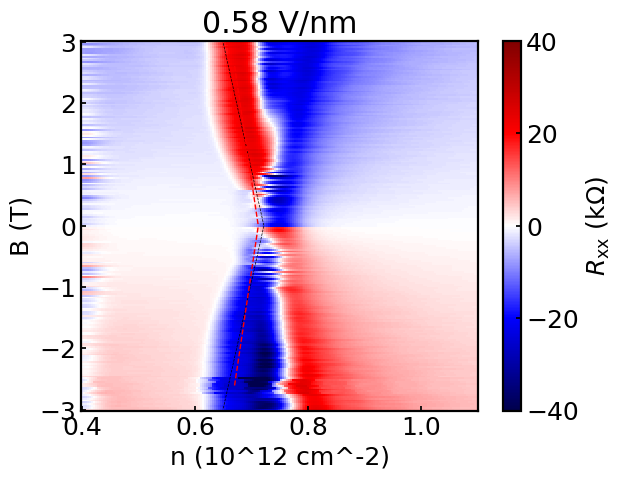

In [188]:
#plot Landau fan at 0.58V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][0]/1000/1e-10/1e3)
    
D = 0.58
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x15 = np.linspace(0.65, 0.722, 100)
y15 = (x15 - 0.722)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.65, 0.722, 100)
y16 = (x16 - 0.722)*(Phi_0*1e-2)*(1)

x17 = np.linspace(0.67, 0.712, 100)
y17 = (x17 - 0.712)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.67, 0.712, 100)
y18 = (x18 - 0.712)*(Phi_0*1e-2)*(3/2)

ax.plot(x15, y15, 'k--', linewidth=0.5)
ax.plot(x16, y16, 'k--', linewidth=0.5)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)
plt.title('0.58 V/nm')

fname = './LFv=1figures/0p58vnm_rxy.png'
plt.savefig(fname, bbox_inches = 'tight')

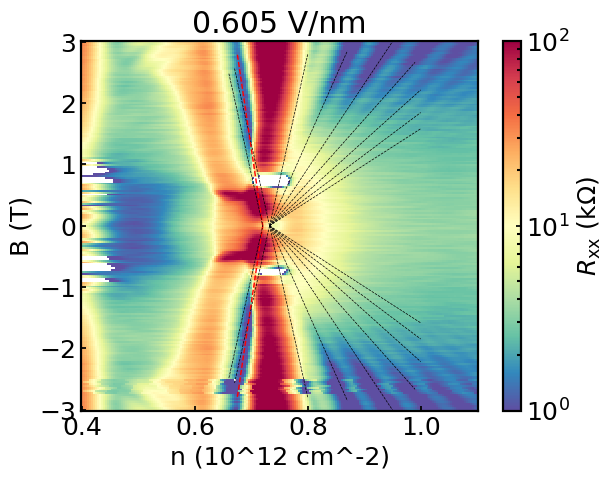

In [178]:
#plot Landau fan at 0.605V/nm, rxx

r_hg_x_2D = []
for i in range(0, len(database)):
    r_hg_x_2D.append(database[i]['v_hg_x_2d'][1]/1000/1e-10/1e3)
    
D = 0.605
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e0, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(0.732, 0.8, 100)
y1 = (x1 - 0.732)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0.732, 0.8, 100)
y2 = (x2 - 0.732)*(Phi_0*1e-2)*(-1)
x3 = np.linspace(0.732, 0.87, 100)
y3 = (x3 - 0.732)*(Phi_0*1e-2)*(1/2)
x4 = np.linspace(0.732, 0.87, 100)
y4 = (x4 - 0.732)*(Phi_0*1e-2)*(-1/2)
x5 = np.linspace(0.732, 0.95, 100)
y5 = (x5 - 0.732)*(Phi_0*1e-2)*(1/3)
x6 = np.linspace(0.732, 0.95, 100)
y6 = (x6 - 0.732)*(Phi_0*1e-2)*(-1/3)
x7 = np.linspace(0.732, 0.99, 100)
y7 = (x7 - 0.732)*(Phi_0*1e-2)*(1/4)
x8 = np.linspace(0.732, 0.99, 100)
y8 = (x8 - 0.732)*(Phi_0*1e-2)*(-1/4)
x9 = np.linspace(0.732, 1.0, 100)
y9 = (x9 - 0.732)*(Phi_0*1e-2)*(1/5)
x10 = np.linspace(0.732, 1.0, 100)
y10 = (x10 - 0.732)*(Phi_0*1e-2)*(-1/5)
x11 = np.linspace(0.732, 1.0, 100)
y11 = (x11 - 0.732)*(Phi_0*1e-2)*(1/6)
x12 = np.linspace(0.732, 1.0, 100)
y12 = (x12 - 0.732)*(Phi_0*1e-2)*(-1/6)
x13 = np.linspace(0.732, 1.0, 100)
y13 = (x13 - 0.732)*(Phi_0*1e-2)*(1/7)
x14 = np.linspace(0.732, 1.0, 100)
y14 = (x14 - 0.732)*(Phi_0*1e-2)*(-1/7)

x15 = np.linspace(0.67, 0.732, 100)
y15 = (x15 - 0.732)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.67, 0.732, 100)
y16 = (x16 - 0.732)*(Phi_0*1e-2)*(1)

x17 = np.linspace(0.675, 0.72, 100)
y17 = (x17 - 0.72)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.675, 0.72, 100)
y18 = (x18 - 0.72)*(Phi_0*1e-2)*(3/2)

x19 = np.linspace(0.66, 0.72, 100)
y19 = (x19 - 0.72)*(Phi_0*1e-2)*(-1)
x20 = np.linspace(0.66, 0.72, 100)
y20 = (x20 - 0.72)*(Phi_0*1e-2)*(1)

ax.plot(x1, y1, 'k--', linewidth=0.5)
ax.plot(x2, y2, 'k--', linewidth=0.5)
ax.plot(x3, y3, 'k--', linewidth=0.5)
ax.plot(x4, y4, 'k--', linewidth=0.5)
ax.plot(x5, y5, 'k--', linewidth=0.5)
ax.plot(x6, y6, 'k--', linewidth=0.5)
ax.plot(x7, y7, 'k--', linewidth=0.5)
ax.plot(x8, y8, 'k--', linewidth=0.5)
ax.plot(x9, y9, 'k--', linewidth=0.5)
ax.plot(x10, y10, 'k--', linewidth=0.5)
ax.plot(x11, y11, 'k--', linewidth=0.5)
ax.plot(x12, y12, 'k--', linewidth=0.5)
ax.plot(x13, y13, 'k--', linewidth=0.5)
ax.plot(x14, y14, 'k--', linewidth=0.5)
ax.plot(x15, y15, 'k--', linewidth=0.5)
ax.plot(x16, y16, 'k--', linewidth=0.5)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)
ax.plot(x19, y19, 'k--', linewidth=0.5)
ax.plot(x20, y20, 'k--', linewidth=0.5)

plt.title('0.605 V/nm')

fname = './LFv=1figures/0p605vnm_rxx.png'
plt.savefig(fname, bbox_inches = 'tight')

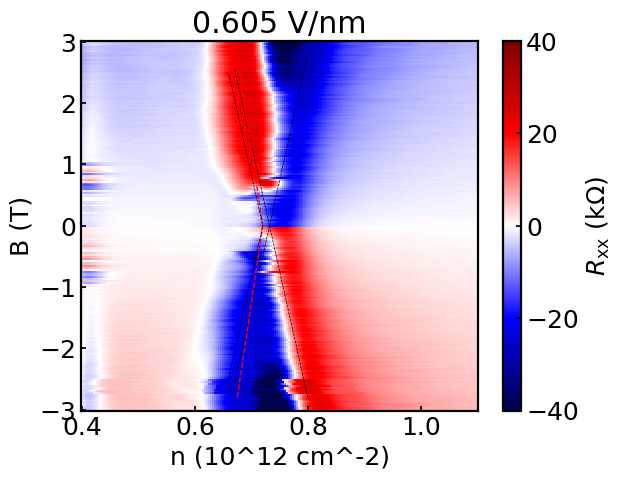

In [189]:
#plot Landau fan at 0.605V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][1]/1000/1e-10/1e3)
    
D = 0.605
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(0.732, 0.8, 100)
y1 = (x1 - 0.732)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0.732, 0.8, 100)
y2 = (x2 - 0.732)*(Phi_0*1e-2)*(-1)

x15 = np.linspace(0.67, 0.732, 100)
y15 = (x15 - 0.732)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.67, 0.732, 100)
y16 = (x16 - 0.732)*(Phi_0*1e-2)*(1)

x17 = np.linspace(0.675, 0.72, 100)
y17 = (x17 - 0.72)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.675, 0.72, 100)
y18 = (x18 - 0.72)*(Phi_0*1e-2)*(3/2)

x19 = np.linspace(0.66, 0.72, 100)
y19 = (x19 - 0.72)*(Phi_0*1e-2)*(-1)
x20 = np.linspace(0.66, 0.72, 100)
y20 = (x20 - 0.72)*(Phi_0*1e-2)*(1)

ax.plot(x1, y1, 'k--', linewidth=0.5)
ax.plot(x2, y2, 'k--', linewidth=0.5)
ax.plot(x15, y15, 'k--', linewidth=0.5)
ax.plot(x16, y16, 'k--', linewidth=0.5)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)
ax.plot(x19, y19, 'k--', linewidth=0.5)
ax.plot(x20, y20, 'k--', linewidth=0.5)

plt.title('0.605 V/nm')

fname = './LFv=1figures/0p605vnm_rxy.png'
plt.savefig(fname, bbox_inches = 'tight')

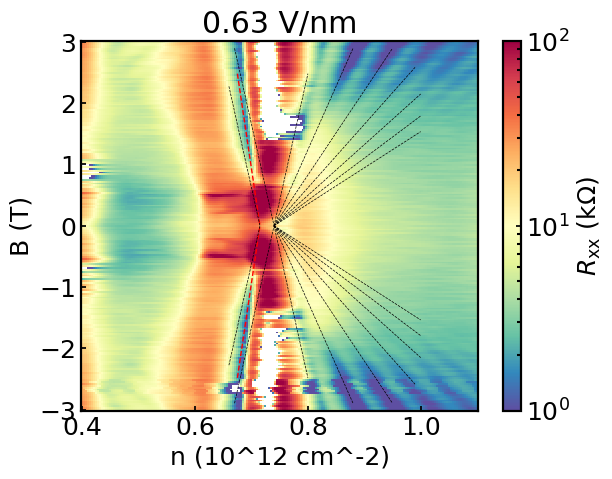

In [179]:
#plot Landau fan at 0.63V/nm, rxx

r_hg_x_2D = []
for i in range(0, len(database)):
    r_hg_x_2D.append(database[i]['v_hg_x_2d'][2]/1000/1e-10/1e3)
    
D = 0.63
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

x1 = np.linspace(0.74, 0.8, 100)
y1 = (x1 - 0.74)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0.74, 0.8, 100)
y2 = (x2 - 0.74)*(Phi_0*1e-2)*(-1)
x3 = np.linspace(0.74, 0.88, 100)
y3 = (x3 - 0.74)*(Phi_0*1e-2)*(1/2)
x4 = np.linspace(0.74, 0.88, 100)
y4 = (x4 - 0.74)*(Phi_0*1e-2)*(-1/2)
x5 = np.linspace(0.74, 0.95, 100)
y5 = (x5 - 0.74)*(Phi_0*1e-2)*(1/3)
x6 = np.linspace(0.74, 0.95, 100)
y6 = (x6 - 0.74)*(Phi_0*1e-2)*(-1/3)
x7 = np.linspace(0.74, 0.99, 100)
y7 = (x7 - 0.74)*(Phi_0*1e-2)*(1/4)
x8 = np.linspace(0.74, 0.99, 100)
y8 = (x8 - 0.74)*(Phi_0*1e-2)*(-1/4)
x9 = np.linspace(0.74, 1.0, 100)
y9 = (x9 - 0.74)*(Phi_0*1e-2)*(1/5)
x10 = np.linspace(0.74, 1.0, 100)
y10 = (x10 - 0.74)*(Phi_0*1e-2)*(-1/5)
x11 = np.linspace(0.74, 1.0, 100)
y11 = (x11 - 0.74)*(Phi_0*1e-2)*(1/6)
x12 = np.linspace(0.74, 1.0, 100)
y12 = (x12 - 0.74)*(Phi_0*1e-2)*(-1/6)
x13 = np.linspace(0.74, 1.0, 100)
y13 = (x13 - 0.74)*(Phi_0*1e-2)*(1/7)
x14 = np.linspace(0.74, 1.0, 100)
y14 = (x14 - 0.74)*(Phi_0*1e-2)*(-1/7)

x15 = np.linspace(0.67, 0.74, 100)
y15 = (x15 - 0.74)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.67, 0.74, 100)
y16 = (x16 - 0.74)*(Phi_0*1e-2)*(1)

x17 = np.linspace(0.675, 0.715, 100)
y17 = (x17 - 0.715)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.675, 0.715, 100)
y18 = (x18 - 0.715)*(Phi_0*1e-2)*(3/2)

x19 = np.linspace(0.66, 0.715, 100)
y19 = (x19 - 0.715)*(Phi_0*1e-2)*(-1)
x20 = np.linspace(0.66, 0.715, 100)
y20 = (x20 - 0.715)*(Phi_0*1e-2)*(1)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e0, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.plot(x1, y1, 'k--', linewidth=0.5)
ax.plot(x2, y2, 'k--', linewidth=0.5)
ax.plot(x3, y3, 'k--', linewidth=0.5)
ax.plot(x4, y4, 'k--', linewidth=0.5)
ax.plot(x5, y5, 'k--', linewidth=0.5)
ax.plot(x6, y6, 'k--', linewidth=0.5)
ax.plot(x7, y7, 'k--', linewidth=0.5)
ax.plot(x8, y8, 'k--', linewidth=0.5)
ax.plot(x9, y9, 'k--', linewidth=0.5)
ax.plot(x10, y10, 'k--', linewidth=0.5)
ax.plot(x11, y11, 'k--', linewidth=0.5)
ax.plot(x12, y12, 'k--', linewidth=0.5)
ax.plot(x13, y13, 'k--', linewidth=0.5)
ax.plot(x14, y14, 'k--', linewidth=0.5)
ax.plot(x15, y15, 'k--', linewidth=0.5)
ax.plot(x16, y16, 'k--', linewidth=0.5)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)
ax.plot(x19, y19, 'k--', linewidth=0.5)
ax.plot(x20, y20, 'k--', linewidth=0.5)

plt.title('0.63 V/nm')

fname = './LFv=1figures/0p63vnm_rxx.png'
plt.savefig(fname, bbox_inches = 'tight')

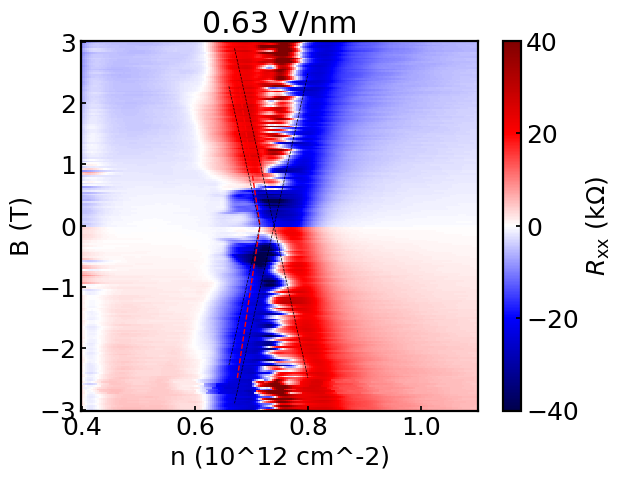

In [190]:
#plot Landau fan at 0.63V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][2]/1000/1e-10/1e3)
    
D = 0.63
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(0.74, 0.8, 100)
y1 = (x1 - 0.74)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0.74, 0.8, 100)
y2 = (x2 - 0.74)*(Phi_0*1e-2)*(-1)

x15 = np.linspace(0.67, 0.74, 100)
y15 = (x15 - 0.74)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.67, 0.74, 100)
y16 = (x16 - 0.74)*(Phi_0*1e-2)*(1)

x17 = np.linspace(0.675, 0.715, 100)
y17 = (x17 - 0.715)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.675, 0.715, 100)
y18 = (x18 - 0.715)*(Phi_0*1e-2)*(3/2)

x19 = np.linspace(0.66, 0.715, 100)
y19 = (x19 - 0.715)*(Phi_0*1e-2)*(-1)
x20 = np.linspace(0.66, 0.715, 100)
y20 = (x20 - 0.715)*(Phi_0*1e-2)*(1)

ax.plot(x1, y1, 'k--', linewidth=0.5)
ax.plot(x2, y2, 'k--', linewidth=0.5)
ax.plot(x15, y15, 'k--', linewidth=0.5)
ax.plot(x16, y16, 'k--', linewidth=0.5)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)
ax.plot(x19, y19, 'k--', linewidth=0.5)
ax.plot(x20, y20, 'k--', linewidth=0.5)

plt.title('0.63 V/nm')

fname = './LFv=1figures/0p63vnm_rxy.png'
plt.savefig(fname, bbox_inches = 'tight')

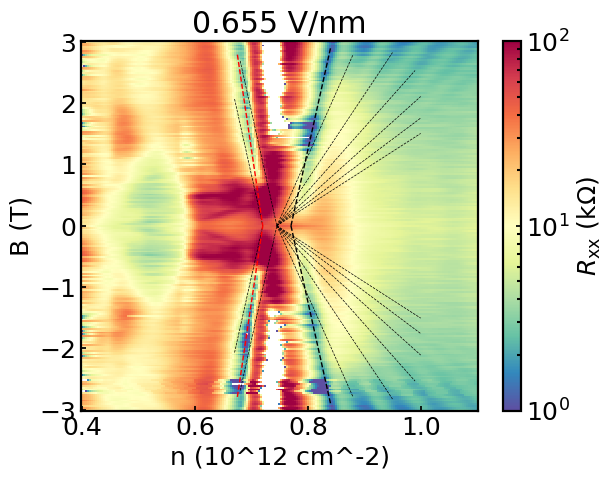

In [180]:
#plot Landau fan at 0.655V/nm, rxx

r_hg_x_2D = []
for i in range(0, len(database)):
    r_hg_x_2D.append(database[i]['v_hg_x_2d'][3]/1000/1e-10/1e3)
    
D = 0.655
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

# fig, ax = plt.subplots(figsize = (20, 10))
fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e0, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')


x1 = np.linspace(0.77, 0.84, 100)
y1 = (x1 - 0.77)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0.77, 0.84, 100)
y2 = (x2 - 0.77)*(Phi_0*1e-2)*(-1)
x3 = np.linspace(0.745, 0.88, 100)
y3 = (x3 - 0.745)*(Phi_0*1e-2)*(1/2)
x4 = np.linspace(0.745, 0.88, 100)
y4 = (x4 - 0.745)*(Phi_0*1e-2)*(-1/2)
x5 = np.linspace(0.745, 0.95, 100)
y5 = (x5 - 0.745)*(Phi_0*1e-2)*(1/3)
x6 = np.linspace(0.745, 0.95, 100)
y6 = (x6 - 0.745)*(Phi_0*1e-2)*(-1/3)
x7 = np.linspace(0.745, 0.99, 100)
y7 = (x7 - 0.745)*(Phi_0*1e-2)*(1/4)
x8 = np.linspace(0.745, 0.99, 100)
y8 = (x8 - 0.745)*(Phi_0*1e-2)*(-1/4)
x9 = np.linspace(0.745, 1.0, 100)
y9 = (x9 - 0.745)*(Phi_0*1e-2)*(1/5)
x10 = np.linspace(0.745, 1.0, 100)
y10 = (x10 - 0.745)*(Phi_0*1e-2)*(-1/5)
x11 = np.linspace(0.745, 1.0, 100)
y11 = (x11 - 0.745)*(Phi_0*1e-2)*(1/6)
x12 = np.linspace(0.745, 1.0, 100)
y12 = (x12 - 0.745)*(Phi_0*1e-2)*(-1/6)
x13 = np.linspace(0.745, 1.0, 100)
y13 = (x13 - 0.745)*(Phi_0*1e-2)*(1/7)
x14 = np.linspace(0.745, 1.0, 100)
y14 = (x14 - 0.745)*(Phi_0*1e-2)*(-1/7)

x15 = np.linspace(0.67, 0.745, 100)
y15 = (x15 - 0.745)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.67, 0.745, 100)
y16 = (x16 - 0.745)*(Phi_0*1e-2)*(1)

x15 = np.linspace(0.67, 0.72, 100)
y15 = (x15 - 0.72)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.67, 0.72, 100)
y16 = (x16 - 0.72)*(Phi_0*1e-2)*(1)
x17 = np.linspace(0.675, 0.72, 100)
y17 = (x17 - 0.72)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.675, 0.72, 100)
y18 = (x18 - 0.72)*(Phi_0*1e-2)*(3/2)
x19 = np.linspace(0.68, 0.745, 100)
y19 = (x19 - 0.745)*(Phi_0*1e-2)*(-1)
x20 = np.linspace(0.68, 0.745, 100)
y20 = (x20 - 0.745)*(Phi_0*1e-2)*(1)

ax.plot(x1, y1, 'k--', linewidth=1)
ax.plot(x2, y2, 'k--', linewidth=1)
ax.plot(x3, y3, 'k--', linewidth=0.5)
ax.plot(x4, y4, 'k--', linewidth=0.5)
ax.plot(x5, y5, 'k--', linewidth=0.5)
ax.plot(x6, y6, 'k--', linewidth=0.5)
ax.plot(x7, y7, 'k--', linewidth=0.5)
ax.plot(x8, y8, 'k--', linewidth=0.5)
ax.plot(x9, y9, 'k--', linewidth=0.5)
ax.plot(x10, y10, 'k--', linewidth=0.5)
ax.plot(x11, y11, 'k--', linewidth=0.5)
ax.plot(x12, y12, 'k--', linewidth=0.5)
ax.plot(x13, y13, 'k--', linewidth=0.5)
ax.plot(x14, y14, 'k--', linewidth=0.5)
ax.plot(x15, y15, 'k--', linewidth=0.5)
ax.plot(x16, y16, 'k--', linewidth=0.5)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)
ax.plot(x19, y19, 'k--', linewidth=0.5)
ax.plot(x20, y20, 'k--', linewidth=0.5)

plt.title('0.655 V/nm')

fname = './LFv=1figures/0p655vnm_rxx.png'
plt.savefig(fname, bbox_inches = 'tight')

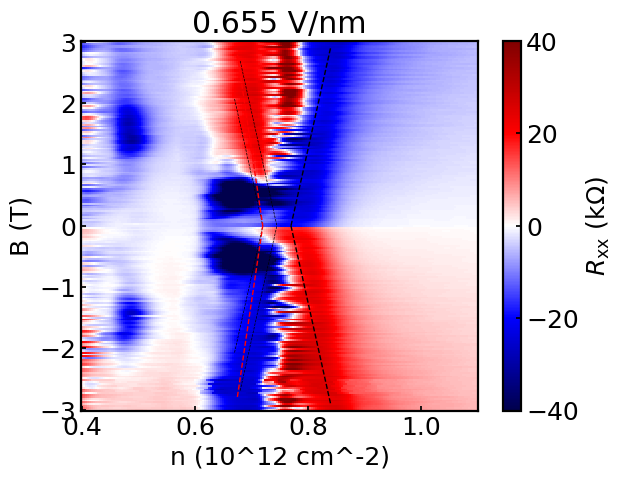

In [191]:
#plot Landau fan at 0.655V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][3]/1000/1e-10/1e3)
    
D = 0.655
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(0.77, 0.84, 100)
y1 = (x1 - 0.77)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0.77, 0.84, 100)
y2 = (x2 - 0.77)*(Phi_0*1e-2)*(-1)

x15 = np.linspace(0.67, 0.745, 100)
y15 = (x15 - 0.745)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.67, 0.745, 100)
y16 = (x16 - 0.745)*(Phi_0*1e-2)*(1)

x15 = np.linspace(0.67, 0.72, 100)
y15 = (x15 - 0.72)*(Phi_0*1e-2)*(-1)
x16 = np.linspace(0.67, 0.72, 100)
y16 = (x16 - 0.72)*(Phi_0*1e-2)*(1)
x17 = np.linspace(0.675, 0.72, 100)
y17 = (x17 - 0.72)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.675, 0.72, 100)
y18 = (x18 - 0.72)*(Phi_0*1e-2)*(3/2)
x19 = np.linspace(0.68, 0.745, 100)
y19 = (x19 - 0.745)*(Phi_0*1e-2)*(-1)
x20 = np.linspace(0.68, 0.745, 100)
y20 = (x20 - 0.745)*(Phi_0*1e-2)*(1)

ax.plot(x1, y1, 'k--', linewidth=1)
ax.plot(x2, y2, 'k--', linewidth=1)
ax.plot(x15, y15, 'k--', linewidth=0.5)
ax.plot(x16, y16, 'k--', linewidth=0.5)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)
ax.plot(x19, y19, 'k--', linewidth=0.5)
ax.plot(x20, y20, 'k--', linewidth=0.5)
plt.title('0.655 V/nm')

fname = './LFv=1figures/0p655vnm_rxy.png'
plt.savefig(fname, bbox_inches = 'tight')

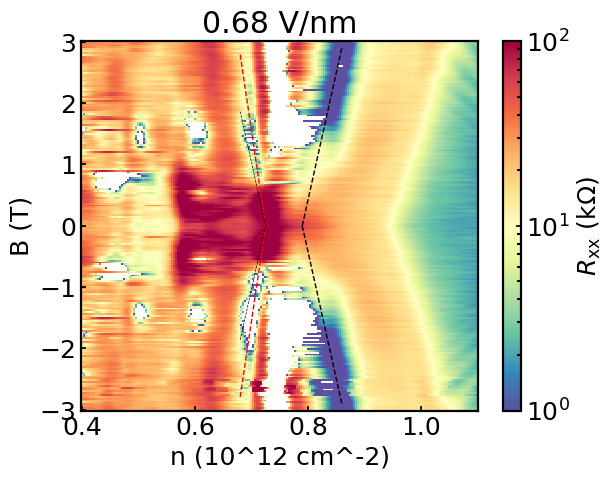

In [181]:
#plot Landau fan at 0.68V/nm, rxx

r_hg_x_2D = []
for i in range(0, len(database)):
    r_hg_x_2D.append(database[i]['v_hg_x_2d'][4]/1000/1e-10/1e3)
    
D = 0.68
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

x1 = np.linspace(0.79, 0.86, 100)
y1 = (x1 - 0.79)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0.79, 0.86, 100)
y2 = (x2 - 0.79)*(Phi_0*1e-2)*(-1)
x17 = np.linspace(0.68, 0.725, 100)
y17 = (x17 - 0.725)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.68, 0.725, 100)
y18 = (x18 - 0.725)*(Phi_0*1e-2)*(3/2)
x19 = np.linspace(0.68, 0.725, 100)
y19 = (x19 - 0.725)*(Phi_0*1e-2)*(-1)
x20 = np.linspace(0.68, 0.725, 100)
y20 = (x20 - 0.725)*(Phi_0*1e-2)*(1)

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e0, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.plot(x1, y1, 'k--', linewidth=1)
ax.plot(x2, y2, 'k--', linewidth=1)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)
ax.plot(x19, y19, 'k--', linewidth=0.5)
ax.plot(x20, y20, 'k--', linewidth=0.5)

plt.title('0.68 V/nm')

fname = './LFv=1figures/0p68vnm_rxx.png'
plt.savefig(fname, bbox_inches = 'tight')

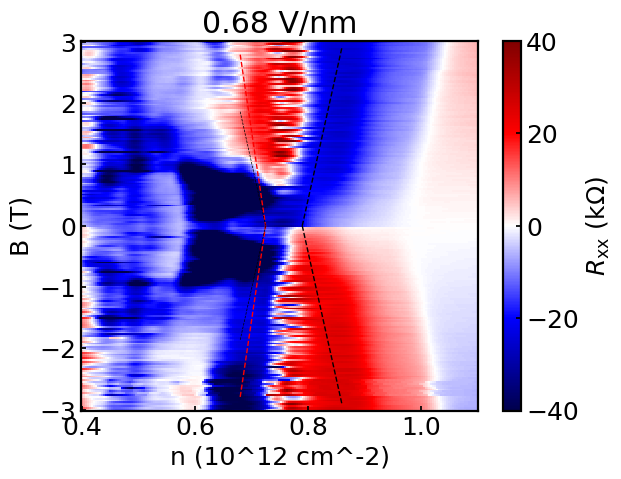

In [192]:
#plot Landau fan at 0.655V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][4]/1000/1e-10/1e3)
    
D = 0.655
n = np.linspace(0.4, 1.1, num = 200)
B = np.linspace(-3, 3, num = 201)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(0.79, 0.86, 100)
y1 = (x1 - 0.79)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0.79, 0.86, 100)
y2 = (x2 - 0.79)*(Phi_0*1e-2)*(-1)
x17 = np.linspace(0.68, 0.725, 100)
y17 = (x17 - 0.725)*(Phi_0*1e-2)*(-3/2)
x18 = np.linspace(0.68, 0.725, 100)
y18 = (x18 - 0.725)*(Phi_0*1e-2)*(3/2)
x19 = np.linspace(0.68, 0.725, 100)
y19 = (x19 - 0.725)*(Phi_0*1e-2)*(-1)
x20 = np.linspace(0.68, 0.725, 100)
y20 = (x20 - 0.725)*(Phi_0*1e-2)*(1)


ax.plot(x1, y1, 'k--', linewidth=1)
ax.plot(x2, y2, 'k--', linewidth=1)
ax.plot(x17, y17, 'r--', linewidth=1)
ax.plot(x18, y18, 'r--', linewidth=1)
ax.plot(x19, y19, 'k--', linewidth=0.5)
ax.plot(x20, y20, 'k--', linewidth=0.5)

plt.title('0.68 V/nm')

fname = './LFv=1figures/0p68vnm_rxy.png'
plt.savefig(fname, bbox_inches = 'tight')

In [ ]:
# Landau fan at D=0.84

In [468]:
database = h5py.File('./LFatD=0p84/dat254.h5', 'r')
list(database.keys())

['metadata',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d',
 'v_ih_x_2d',
 'v_ih_y_2d']

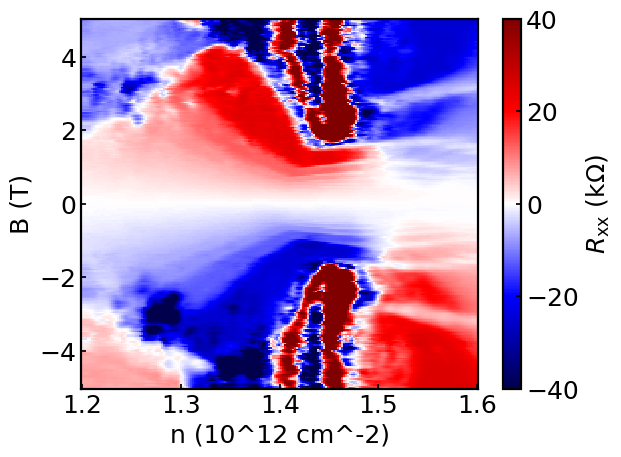

In [469]:
#plot Landau fan at 0.84V/nm, rxy

r_gd_x_2D = np.array(database['v_gd_x_2d'])/1000/1e-10/1e3
    
D = 0.84
n = np.linspace(1.2, 1.6, num = 200)
B = np.linspace(-5, 5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# plt.title('0.68 V/nm')

# fname = './LFv=1figures/0p68vnm_rxy.png'
# plt.savefig(fname, bbox_inches = 'tight')

In [37]:
database = h5py.File('./dat889.h5', 'r')
list(database.keys())

['metadata',
 'v_cd_x_2d',
 'v_cd_y_2d',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hc_x_2d',
 'v_hc_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d']

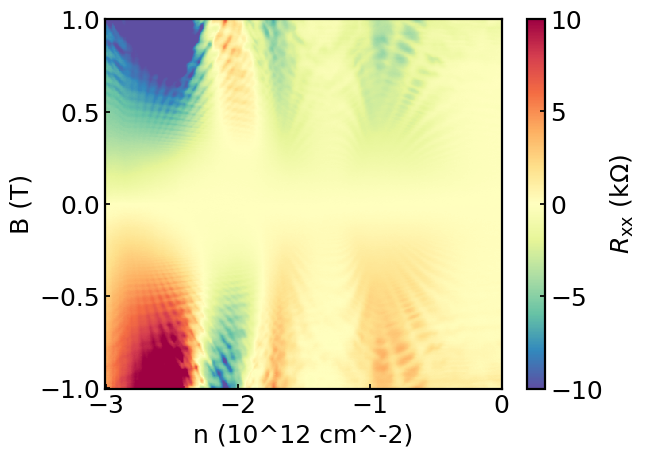

In [63]:
#plot Landau fan at 0.84V/nm, rxy

r_gd_x_2D = np.array(database['v_gd_x_2d'])/1000/1e-10/1e3
    
D = 0.84
n = np.linspace(0, -3, num = 500)
B = np.linspace(1, -1, num = 500)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'Spectral_r', vmin = -10, vmax = 10)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# plt.title('0.68 V/nm')

# fname = './LFv=1figures/0p68vnm_rxy.png'
# plt.savefig(fname, bbox_inches = 'tight')

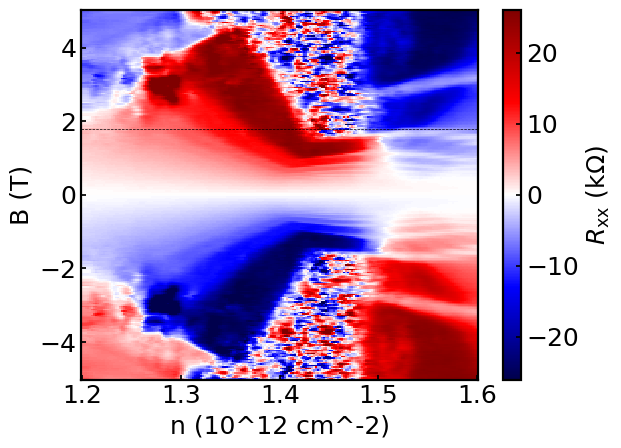

In [470]:
#plot Landau fan at 0.84V/nm, rxy, antisymmetrize

r_gd_x_2D = np.array(database['v_gd_x_2d'])/1000/1e-10/1e3

r_gd_x_2D_antisym_top = (r_gd_x_2D[125:250] - np.flip(r_gd_x_2D[0:125], 0))/2
r_gd_x_2D_antisym_bottom = -(r_gd_x_2D[125:250] - np.flip(r_gd_x_2D[0:125], 0))/2
r_gd_x_2D_antisym = np.concatenate((np.flip(r_gd_x_2D_antisym_bottom, axis = 0), r_gd_x_2D_antisym_top), axis = 0)
    
D = 0.84
n = np.linspace(1.2, 1.6, num = 200)
B = np.linspace(-5, 5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -26, vmax = 26)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axhline(1.8, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5) 

# plt.title('0.84 V/nm')

# fname = './LFatD=0p84/0p84vnm_rxy_antisymmetrized.png'
# plt.savefig(fname, bbox_inches = 'tight')

1.8273092369477908


ValueError: x and y must have same first dimension, but have shapes (200,) and (300,)

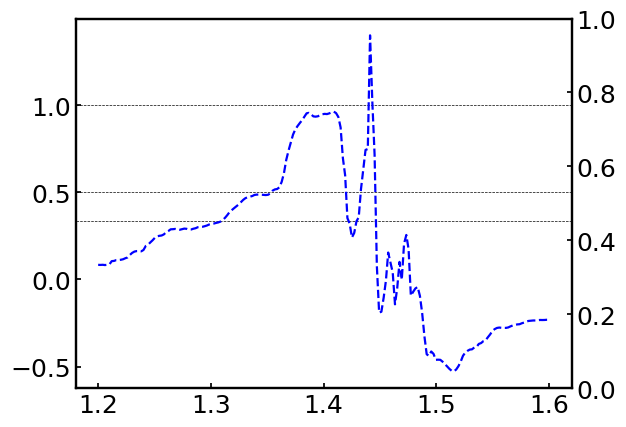

In [471]:
fig, ax = plt.subplots()

ax2 = ax.twinx()

print(B[170])

ax.axhline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5) 
ax.axhline(1/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5) 
# ax.axhline(1/3, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5) 
ax.axhline(1/3, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5) 
# ax.axhline(2/5, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5) 

ax.plot(n, r_gd_x_2D_antisym[170]/25.8, 'b--')
ax2.plot(n, r_hg_x_2D_sym[170]/25.8, 'r--')

250


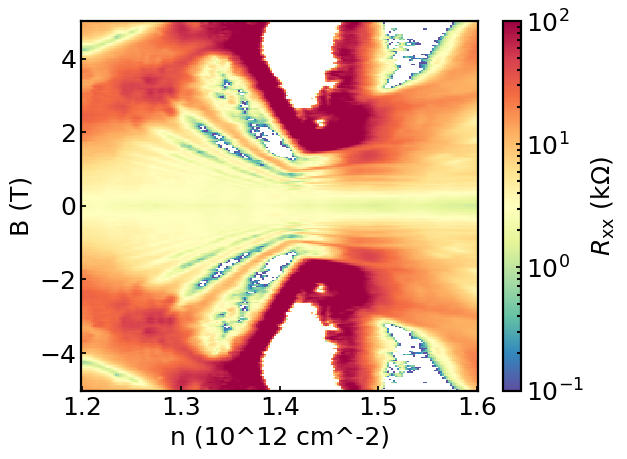

In [474]:
#plot Landau fan at 0.84V/nm, rxx

r_hg_x_2D = np.array(database['v_hg_x_2d'])/1000/1e-10/1e3

r_hg_x_2D_sym_top = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym_bottom = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym = np.concatenate((np.flip(r_hg_x_2D_sym_bottom, axis = 0), r_hg_x_2D_sym_top), axis = 0)
    
D = 0.84
n = np.linspace(1.2, 1.6, num = 200)
B = np.linspace(-5, 5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')


x1 = np.linspace(1.35, 1.43, 100)
y1 = (x1 - 1.43)*(Phi_0*1e-2)*(1)
x2 = np.linspace(1.35, 1.43, 100)
y2 = (x2 - 1.43)*(Phi_0*1e-2)*(-1)
x3 = np.linspace(1.35, 1.45, 100)
y3 = (x3 - 1.45)*(Phi_0*1e-2)*(3/4)
x4 = np.linspace(1.35, 1.45, 100)
y4 = (x4 - 1.45)*(Phi_0*1e-2)*(-3/4)
x5 = np.linspace(1.35, 1.43, 100)
y5 = (x5 - 1.43)*(Phi_0*1e-2)*(1/2)
x6 = np.linspace(1.35, 1.43, 100)
y6 = (x6 - 1.43)*(Phi_0*1e-2)*(-1/2)
x7 = np.linspace(1.35, 1.43, 100)
y7 = (x7 - 1.43)*(Phi_0*1e-2)*(1/3)
x8 = np.linspace(1.35, 1.43, 100)
y8 = (x8 - 1.43)*(Phi_0*1e-2)*(-1/3)
# x9 = np.linspace(1.35, 1.43, 100)
# y9 = (x9 - 1.43)*(Phi_0*1e-2)*(1/5)
# x10 = np.linspace(0.745, 1.0, 100)
# y10 = (x10 - 0.745)*(Phi_0*1e-2)*(-1/5)
# x11 = np.linspace(0.745, 1.0, 100)
# y11 = (x11 - 0.745)*(Phi_0*1e-2)*(1/6)
# x12 = np.linspace(0.745, 1.0, 100)
# y12 = (x12 - 0.745)*(Phi_0*1e-2)*(-1/6)
# x13 = np.linspace(0.745, 1.0, 100)
# y13 = (x13 - 0.745)*(Phi_0*1e-2)*(1/7)
# x14 = np.linspace(0.745, 1.0, 100)
# y14 = (x14 - 0.745)*(Phi_0*1e-2)*(-1/7)

# x15 = np.linspace(0.67, 0.745, 100)
# y15 = (x15 - 0.745)*(Phi_0*1e-2)*(-1)
# x16 = np.linspace(0.67, 0.745, 100)
# y16 = (x16 - 0.745)*(Phi_0*1e-2)*(1)

# x15 = np.linspace(0.67, 0.72, 100)
# y15 = (x15 - 0.72)*(Phi_0*1e-2)*(-1)
# x16 = np.linspace(0.67, 0.72, 100)
# y16 = (x16 - 0.72)*(Phi_0*1e-2)*(1)
# x17 = np.linspace(0.675, 0.72, 100)
# y17 = (x17 - 0.72)*(Phi_0*1e-2)*(-3/2)
# x18 = np.linspace(0.675, 0.72, 100)
# y18 = (x18 - 0.72)*(Phi_0*1e-2)*(3/2)
# x19 = np.linspace(0.68, 0.745, 100)
# y19 = (x19 - 0.745)*(Phi_0*1e-2)*(-1)
# x20 = np.linspace(0.68, 0.745, 100)
# y20 = (x20 - 0.745)*(Phi_0*1e-2)*(1)

# ax.plot(x1, y1, 'k--', linewidth=1)
# ax.plot(x2, y2, 'k--', linewidth=1)
# ax.plot(x3, y3, 'k--', linewidth=0.5)
# ax.plot(x4, y4, 'k--', linewidth=0.5)
# ax.plot(x5, y5, 'k--', linewidth=0.5)
# ax.plot(x6, y6, 'k--', linewidth=0.5)
# ax.plot(x7, y7, 'k--', linewidth=0.5)
# ax.plot(x8, y8, 'k--', linewidth=0.5)
# ax.plot(x9, y9, 'k--', linewidth=0.5)
# ax.plot(x10, y10, 'k--', linewidth=0.5)
# ax.plot(x11, y11, 'k--', linewidth=0.5)
# ax.plot(x12, y12, 'k--', linewidth=0.5)
# ax.plot(x13, y13, 'k--', linewidth=0.5)
# ax.plot(x14, y14, 'k--', linewidth=0.5)
# ax.plot(x15, y15, 'k--', linewidth=0.5)
# ax.plot(x16, y16, 'k--', linewidth=0.5)
# ax.plot(x17, y17, 'r--', linewidth=1)
# ax.plot(x18, y18, 'r--', linewidth=1)
# ax.plot(x19, y19, 'k--', linewidth=0.5)
# ax.plot(x20, y20, 'k--', linewidth=0.5)

print(len(r_hg_x_2D))

# plt.title('0.84 V/nm')

# fname = './LFatD=0p84/0p84vnm_rxy_symmetrized_linear.png'
# plt.savefig(fname, bbox_inches = 'tight')

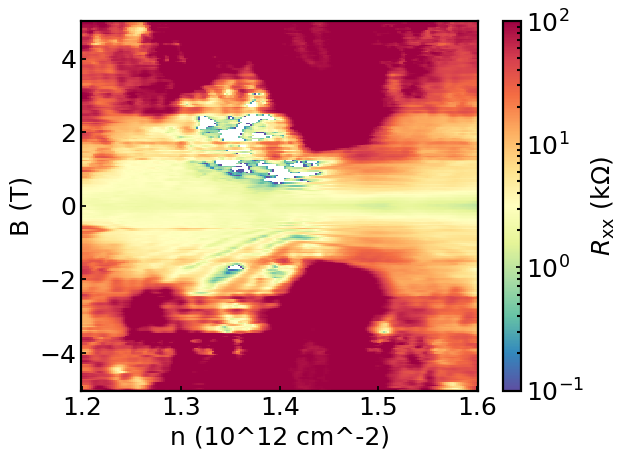

In [199]:
#plot Landau fan at 0.84V/nm, rxx

r_ih_x_2D = np.array(database['v_ih_x_2d'])/1000/1e-10/1e3
    
D = 0.84
n = np.linspace(1.2, 1.6, num = 200)
B = np.linspace(-5, 5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_ih_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# plt.title('0.68 V/nm')

# fname = './LFv=1figures/0p68vnm_rxy.png'
# plt.savefig(fname, bbox_inches = 'tight')

In [ ]:
#LF through v = 2

In [55]:
database = h5py.File('./LFthroughv=2/dat255.h5', 'r')
list(database.keys())

['metadata',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d',
 'v_ih_x_2d',
 'v_ih_y_2d']

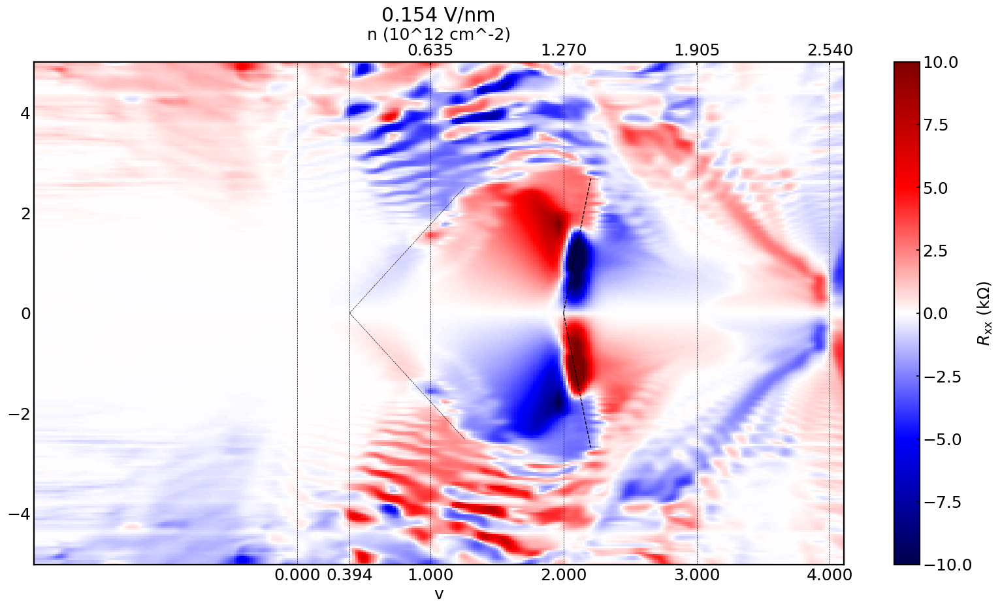

In [56]:
#plot Landau fan through v=2, rxy, antisymmetrize,  D=0.154

r_gd_x_2D = np.array(database['v_gd_x_2d'])/1000/1e-9/1e3

r_gd_x_2D_antisym_top = (r_gd_x_2D[125:250] - np.flip(r_gd_x_2D[0:125], 0))/2
r_gd_x_2D_antisym_bottom = -(r_gd_x_2D[125:250] - np.flip(r_gd_x_2D[0:125], 0))/2
r_gd_x_2D_antisym = np.concatenate((np.flip(r_gd_x_2D_antisym_bottom, axis = 0), r_gd_x_2D_antisym_top), axis = 0)
    
D = 0.154
n = np.linspace(-1.25, 2.6, num = 300)
B = np.linspace(5, -5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax2 = plt.subplots(figsize = (20, 10))

ax2.pcolormesh(xv_v, yv_v, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -10, vmax = 10)
ax2.set_xlabel('v')

ax = ax2.twiny()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -10, vmax = 10)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# ax.axhline(1.8, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5) 

x1 = np.linspace(1.27, 1.4, 100)
y1 = (x1 - 1.27)*(Phi_0*1e-2)*(1/2)
x2 = np.linspace(1.27, 1.4, 100)
y2 = (x2 - 1.27)*(Phi_0*1e-2)*(-1/2)
x3 = np.linspace(1.2, 1.32, 100)
y3 = (x3 - 1.32)*(Phi_0*1e-2)*(1)
x4 = np.linspace(1.2, 1.32, 100)
y4 = (x4 - 1.32)*(Phi_0*1e-2)*(-1)
x5 = np.linspace(1.2, 1.32, 100)
y5 = (x5 - 1.32)*(Phi_0*1e-2)*(1/3)
x6 = np.linspace(1.2, 1.32, 100)
y6 = (x6 - 1.32)*(Phi_0*1e-2)*(-1/3)
x7 = np.linspace(0.25, 0.8, 100)
y7 = (x7 - 0.25)*(Phi_0*1e-2)*(1/9)
x8 = np.linspace(0.25, 0.8, 100)
y8 = (x8 - 0.25)*(Phi_0*1e-2)*(-1/9)


ax.plot(x1, y1, 'k--', linewidth=1)
ax.plot(x2, y2, 'k--', linewidth=1)
# ax.plot(x3, y3, 'k--', linewidth=0.5)
# ax.plot(x4, y4, 'k--', linewidth=0.5)
# ax.plot(x5, y5, 'k--', linewidth=0.5)
# ax.plot(x6, y6, 'k--', linewidth=0.5)
ax.plot(x7, y7, 'k--', linewidth=0.5)
ax.plot(x8, y8, 'k--', linewidth=0.5)


ax.axvline(0, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(0.25, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axvline(1.32, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(0.635, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(2.54/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(2.54*(3/4), 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(2.54, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_xticks([2.54/4, 2.54/2, 2.54*(3/4), 2.54])
ax2.set_xticks([0, (0.25/2.54)*4, 1, 2, 3, 4])

plt.title('0.154 V/nm')


fname = './LFthroughv=2/0p154vnm_rxy_antisymmetrized_withlinesdrawn.png'
plt.savefig(fname, bbox_inches = 'tight')

1.1847389558232932


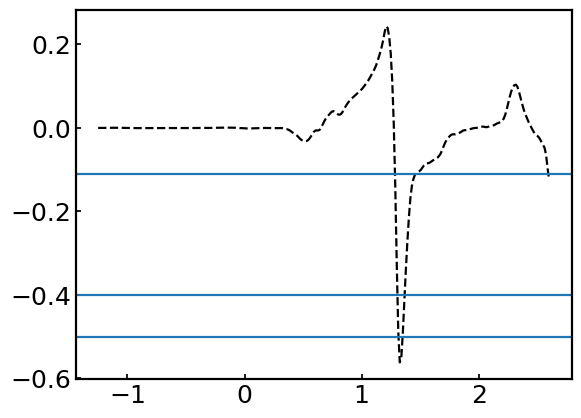

In [513]:
fig, ax = plt.subplots()

print(B[95])

ax.plot(n, r_gd_x_2D_antisym[95]/25.8, 'k--')

ax.axhline(-1/9, 0, 1)
ax.axhline(-0.5, 0, 1)
ax.axhline(-0.4, 0, 1)

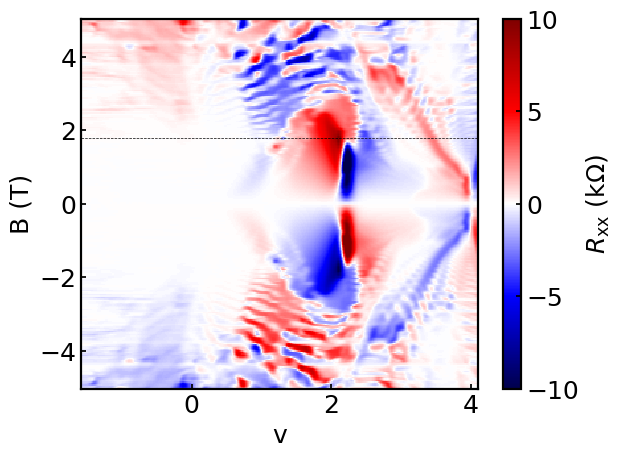

In [57]:
#plot Landau fan through v=2, rxy, antisymmetrize

r_gd_x_2D = np.array(database['v_gd_x_2d'])/1000/1e-9/1e3

r_gd_x_2D_antisym_top = (r_gd_x_2D[125:250] - np.flip(r_gd_x_2D[0:125], 0))/2
r_gd_x_2D_antisym_bottom = -(r_gd_x_2D[125:250] - np.flip(r_gd_x_2D[0:125], 0))/2
r_gd_x_2D_antisym = np.concatenate((np.flip(r_gd_x_2D_antisym_bottom, axis = 0), r_gd_x_2D_antisym_top), axis = 0)
    
D = 0.84
n = np.linspace(-1, 2.6, num = 300)
B = np.linspace(5, -5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -10, vmax = 10)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axhline(1.8, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5) 


# plt.title('0.84 V/nm')

# fname = './LFatD=0p84/0p84vnm_rxy_antisymmetrized.png'
# plt.savefig(fname, bbox_inches = 'tight')

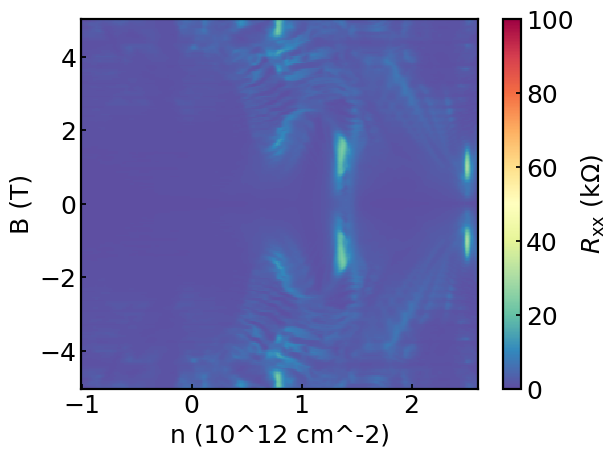

In [343]:
#plot Landau fan at through v=2, rxx, symmetrized

r_hg_x_2D = np.array(database['v_hg_x_2d'])/1000/1e-9/1e3

r_hg_x_2D_sym_top = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym_bottom = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym = np.concatenate((np.flip(r_hg_x_2D_sym_bottom, axis = 0), r_hg_x_2D_sym_top), axis = 0)
    
n = np.linspace(-1, 2.6, num = 300)
B = np.linspace(5, -5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D_sym, cmap = 'Spectral_r', vmin = 0, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# plt.title('0.84 V/nm')

# fname = './LFatD=0p84/0p84vnm_rxy_symmetrized_linear.png'
# plt.savefig(fname, bbox_inches = 'tight')

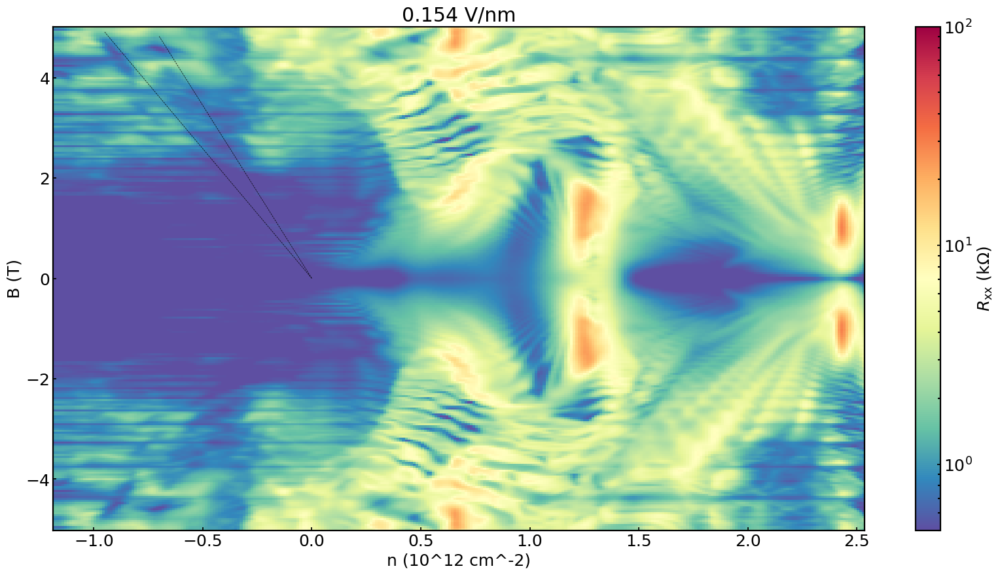

In [63]:
#plot Landau fan at through v=2, rxx, symmetrized

r_hg_x_2D = np.array(database['v_hg_x_2d'])/1000/1e-9/1e3

r_hg_x_2D_sym_top = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym_bottom = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym = np.concatenate((np.flip(r_hg_x_2D_sym_bottom, axis = 0), r_hg_x_2D_sym_top), axis = 0)
    
n = np.linspace(-1.18, 2.53, num = 300)
B = np.linspace(5, -5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 5e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(-0.95, 0, 100)
y1 = (x1 - 0)*(Phi_0*1e-2)*(-1/8)
x2 = np.linspace(-0.7, 0, 100)
y2 = (x2 - 0)*(Phi_0*1e-2)*(-1/6)
# x2 = np.linspace(1, 1.35, 100)
# y2 = (x2 - 1.35)*(Phi_0*1e-2)*(-1/3)
# x3 = np.linspace(1, 1.35, 100)
# y3 = (x3 - 1.35)*(Phi_0*1e-2)*(1/4)
# x4 = np.linspace(1, 1.35, 100)
# y4 = (x4 - 1.35)*(Phi_0*1e-2)*(-1/4)
# x5 = np.linspace(1, 1.35, 100)
# y5 = (x5 - 1.35)*(Phi_0*1e-2)*(1/5)
# x6 = np.linspace(1, 1.35, 100)
# y6 = (x6 - 1.35)*(Phi_0*1e-2)*(-1/5)
# x7 = np.linspace(1, 1.35, 100)
# y7 = (x7 - 1.35)*(Phi_0*1e-2)*(1/6)
# x8 = np.linspace(1, 1.35, 100)
# y8 = (x8 - 1.35)*(Phi_0*1e-2)*(-1/6)
# x9 = np.linspace(1, 1.35, 100)
# y9 = (x9 - 1.35)*(Phi_0*1e-2)*(1/7)
# x10 = np.linspace(1, 1.35, 100)
# y10 = (x10 - 1.35)*(Phi_0*1e-2)*(-1/7)
# x11 = np.linspace(1, 1.35, 100)
# y11 = (x11 - 1.35)*(Phi_0*1e-2)*(1/8)
# x12 = np.linspace(1, 1.35, 100)
# y12 = (x12 - 1.35)*(Phi_0*1e-2)*(-1/8)


ax.plot(x1, y1, 'k--', linewidth=0.5)
ax.plot(x2, y2, 'k--', linewidth=0.5)
# ax.plot(x3, y3, 'k--', linewidth=0.5)
# ax.plot(x4, y4, 'k--', linewidth=0.5)
# ax.plot(x5, y5, 'k--', linewidth=0.5)
# ax.plot(x6, y6, 'k--', linewidth=0.5)
# ax.plot(x6, y6, 'k--', linewidth=0.5)
# ax.plot(x7, y7, 'k--', linewidth=0.5)
# ax.plot(x8, y8, 'k--', linewidth=0.5)
# ax.plot(x9, y9, 'k--', linewidth=0.5)
# ax.plot(x10, y10, 'k--', linewidth=0.5)
# ax.plot(x11, y11, 'k--', linewidth=0.5)
# ax.plot(x12, y12, 'k--', linewidth=0.5)

# Brown Zac oscillations:

# ns = 2.54e16
# Phi_0 = 4.136e-15

# F1 = (ns*Phi_0/4)*(1/8)
# F2 = (ns*Phi_0/4)*(1/10)
# F3 = (ns*Phi_0/4)*(1/6)
# F4 = (ns*Phi_0/4)*(1/7)
# F5 = (ns*Phi_0/4)*(1/9)
# # F6 = (ns*Phi_0/4)*(2/11)
# # F7 = (ns*Phi_0/4)*(2/13)
# F8 = (ns*Phi_0/4)*(1/11)
# F9 = (ns*Phi_0/4)*(1/12)

# ax.axhline(F1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(F2, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(F3, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(F4, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(F5, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# # ax.axhline(F6, 0, 1, c = 'k', linestyle = '--', linewidth = 0.4)
# # ax.axhline(F7, 0, 1, c = 'k', linestyle = '--', linewidth = 0.4)
# ax.axhline(F8, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(F9, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(-F1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(-F2, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(-F3, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(-F4, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(-F5, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# # ax.axhline(F6, 0, 1, c = 'k', linestyle = '--', linewidth = 0.4)
# # ax.axhline(F7, 0, 1, c = 'k', linestyle = '--', linewidth = 0.4)
# ax.axhline(-F8, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)
# ax.axhline(-F9, 0, 1, c = 'k', linestyle = '--', linewidth = 0.1)

# ax.set_yticks([F1, F2, F3, F4, F5, F8, F9], ["1/8", "1/10", "1/6", "1/7", "1/9", "1/11", "1/12"], size = 'small')
# ax.tick_params(axis = 'y', length = 10)

plt.title('0.154 V/nm')

fname = './LFthroughv=2/rxx_symmetrized_log_BrownZac.png'
plt.savefig(fname, bbox_inches = 'tight')

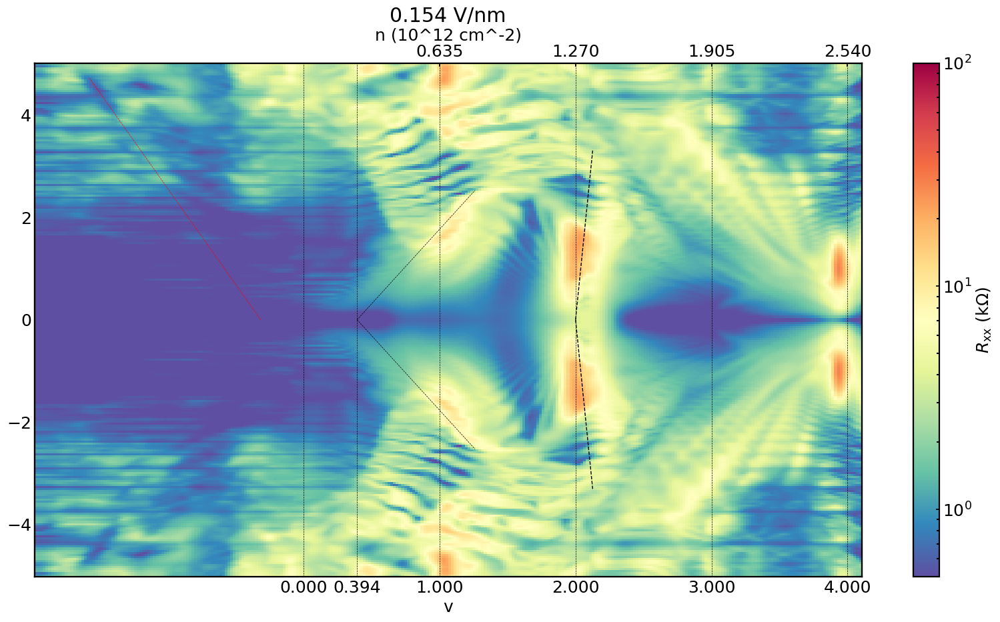

In [516]:
#plot Landau fan through v=2, rxy, antisymmetrize,  D=0.154

r_hg_x_2D = np.array(database['v_hg_x_2d'])/1000/1e-9/1e3

r_hg_x_2D_sym_top = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym_bottom = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym = np.concatenate((np.flip(r_hg_x_2D_sym_bottom, axis = 0), r_hg_x_2D_sym_top), axis = 0)
    
D = 0.154
n = np.linspace(-1.25, 2.6, num = 300)
B = np.linspace(5, -5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax2 = plt.subplots(figsize = (20, 10))

ax2.pcolormesh(xv_v, yv_v, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 5e-1, vmax = 1e2)
ax2.set_xlabel('v')

ax = ax2.twiny()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_hg_x_2D_sym, cmap = 'Spectral_r', norm ='log', vmin = 5e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# ax.axhline(1.8, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5) 

x1 = np.linspace(1.27, 1.35, 100)
y1 = (x1 - 1.27)*(Phi_0*1e-2)*(1)
x2 = np.linspace(1.27, 1.35, 100)
y2 = (x2 - 1.27)*(Phi_0*1e-2)*(-1)
x3 = np.linspace(1.2, 1.32, 100)
y3 = (x3 - 1.32)*(Phi_0*1e-2)*(1)
x4 = np.linspace(1.2, 1.32, 100)
y4 = (x4 - 1.32)*(Phi_0*1e-2)*(-1)
x5 = np.linspace(1.2, 1.32, 100)
y5 = (x5 - 1.32)*(Phi_0*1e-2)*(1/3)
x6 = np.linspace(1.2, 1.32, 100)
y6 = (x6 - 1.32)*(Phi_0*1e-2)*(-1/3)
x7 = np.linspace(0.25, 0.8, 100)
y7 = (x7 - 0.25)*(Phi_0*1e-2)*(1/9)
x8 = np.linspace(0.25, 0.8, 100)
y8 = (x8 - 0.25)*(Phi_0*1e-2)*(-1/9)


ax.plot(x1, y1, 'k--', linewidth=1)
ax.plot(x2, y2, 'k--', linewidth=1)
# ax.plot(x3, y3, 'k--', linewidth=0.5)
# ax.plot(x4, y4, 'k--', linewidth=0.5)
# ax.plot(x5, y5, 'k--', linewidth=0.5)
# ax.plot(x6, y6, 'k--', linewidth=0.5)
ax.plot(x7, y7, 'k--', linewidth=0.5)
ax.plot(x8, y8, 'k--', linewidth=0.5)

x10 = np.linspace(-1, -0.2, 100)
y10 = (x10 + 0.2)*(Phi_0*1e-2)*(-1/7)

ax.plot(x10, y10, 'r--', linewidth=0.5)



ax.axvline(0, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(0.25, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axvline(1.32, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(0.635, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(2.54/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(2.54*(3/4), 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axvline(2.54, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_xticks([2.54/4, 2.54/2, 2.54*(3/4), 2.54])
ax2.set_xticks([0, (0.25/2.54)*4, 1, 2, 3, 4])

plt.title('0.154 V/nm')


fname = './LFthroughv=2/0p154vnm_rxx_symmetrized_withlinesdrawn.png'
plt.savefig(fname, bbox_inches = 'tight')

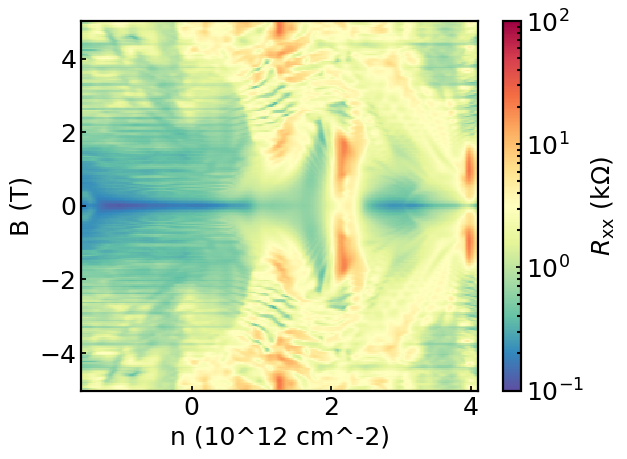

In [345]:
#plot Landau fan at through v=2, rxx, symmetrized

r_hg_x_2D = np.array(database['v_ih_x_2d'])/1000/1e-9/1e3

r_hg_x_2D_sym_top = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym_bottom = (r_hg_x_2D[125:250] + np.flip(r_hg_x_2D[0:125], 0))/2
r_hg_x_2D_sym = np.concatenate((np.flip(r_hg_x_2D_sym_bottom, axis = 0), r_hg_x_2D_sym_top), axis = 0)
    
n = np.linspace(-1, 2.6, num = 300)
B = np.linspace(5, -5, num = 250)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots()

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv_v, yv_v, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# plt.title('0.84 V/nm')

# fname = './LFatD=0p84/0p84vnm_rxy_symmetrized_linear.png'
# plt.savefig(fname, bbox_inches = 'tight')

In [ ]:
# 2D map 100 mk B=0.1T, v = 1

In [64]:
database = h5py.File('./2Dmapv=1_100mk_B=0.1T/dat259.h5', 'r')
list(database.keys())

['metadata',
 'v_cd_x_2d',
 'v_cd_y_2d',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hc_x_2d',
 'v_hc_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d']

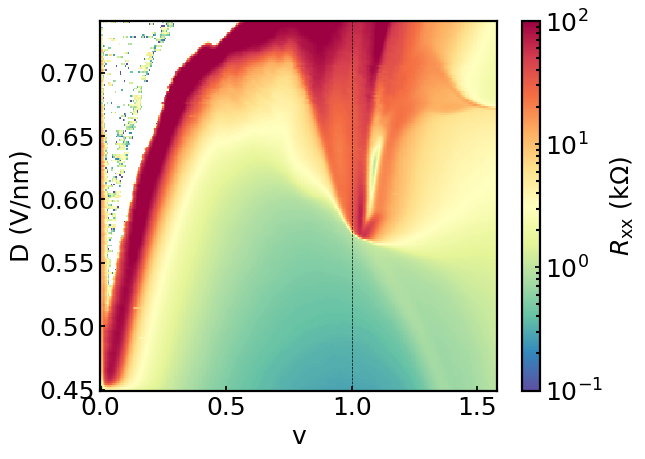

In [69]:
r_cd_x_2D_pos0p1 = np.array(database['v_cd_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_cd_x_2D_pos0p1, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

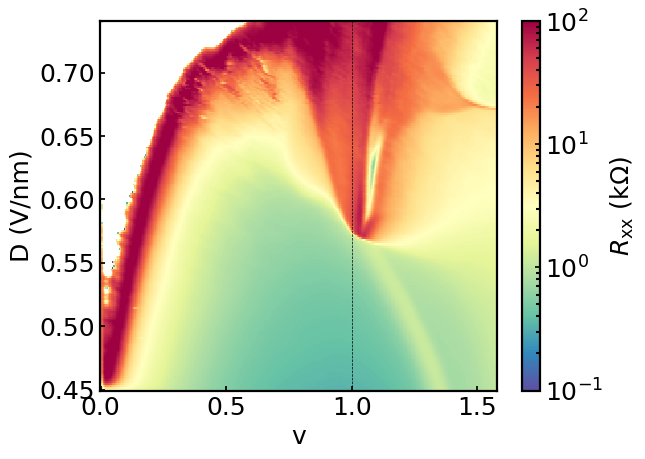

In [70]:
r_hg_x_2D_pos0p1 = np.array(database['v_hg_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_hg_x_2D_pos0p1, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

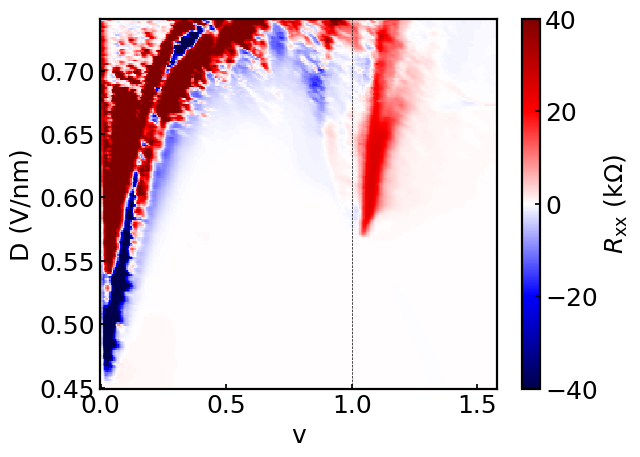

In [72]:
r_hc_x_2D_pos0p1 = np.array(database['v_hc_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_hc_x_2D_pos0p1, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

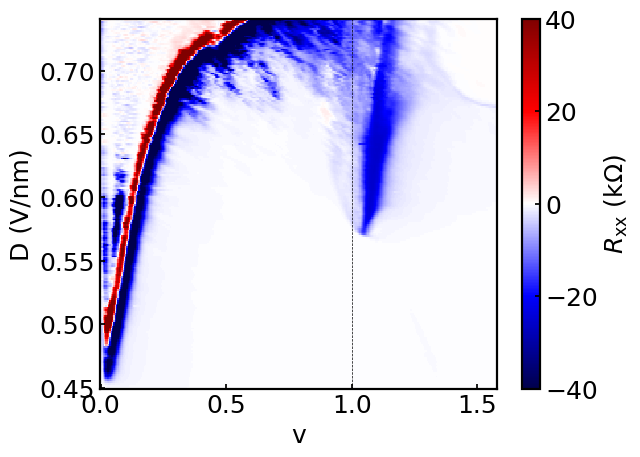

In [73]:
r_gd_x_2D_pos0p1 = np.array(database['v_gd_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_gd_x_2D_pos0p1, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

0.6642211055276381


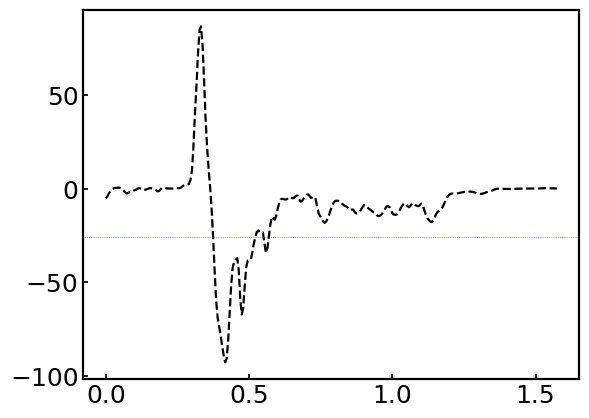

In [84]:
print(slow_D[52])

fig, ax = plt.subplots()

ax.plot(v, r_gd_x_2D_pos0p1[20], 'k--')
ax.axhline(-25.8, 0, 1, linestyle = ':', linewidth = 0.5, c = 'r')

In [ ]:
#2D map v =1 T=100mk, I = 1 nA, B=-0.1T

In [86]:
database = h5py.File('./2Dmapv=1_T=100mk_B=-0.1T/dat260.h5', 'r')
list(database.keys())

['metadata',
 'v_cd_x_2d',
 'v_cd_y_2d',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hc_x_2d',
 'v_hc_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d']

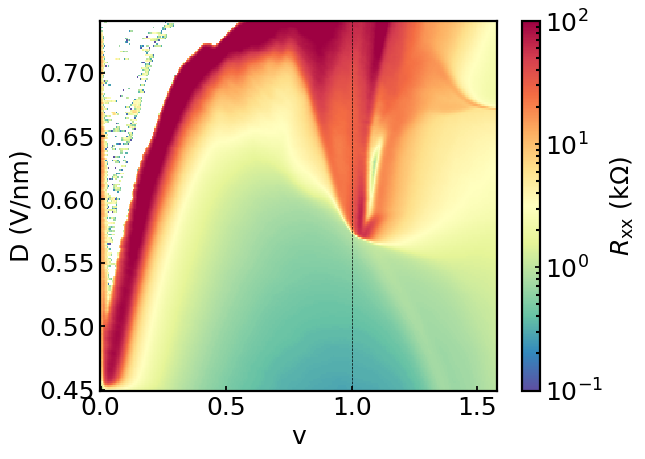

In [87]:
r_cd_x_2D_neg0p1 = np.array(database['v_cd_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_cd_x_2D_neg0p1, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

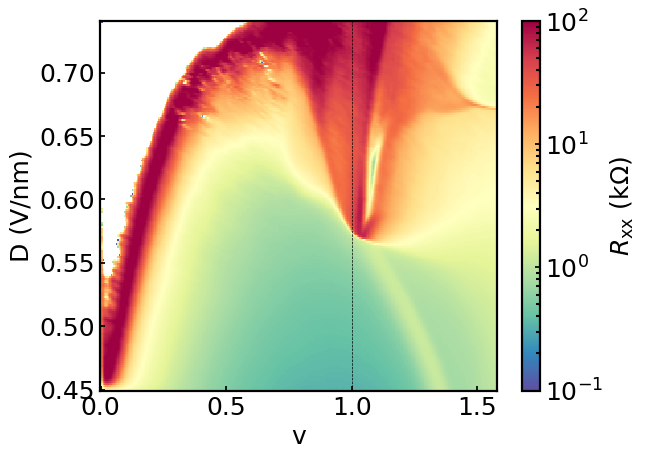

In [93]:
r_hg_x_2D_neg0p1 = np.array(database['v_hg_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_hg_x_2D_neg0p1, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

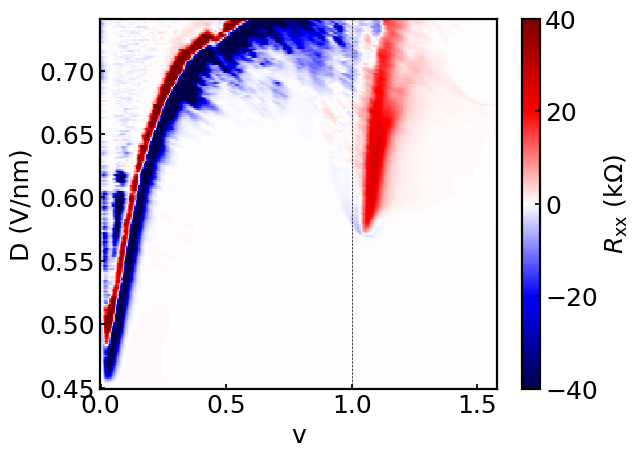

In [88]:
r_gd_x_2D_neg0p1 = np.array(database['v_gd_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_gd_x_2D_neg0p1, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

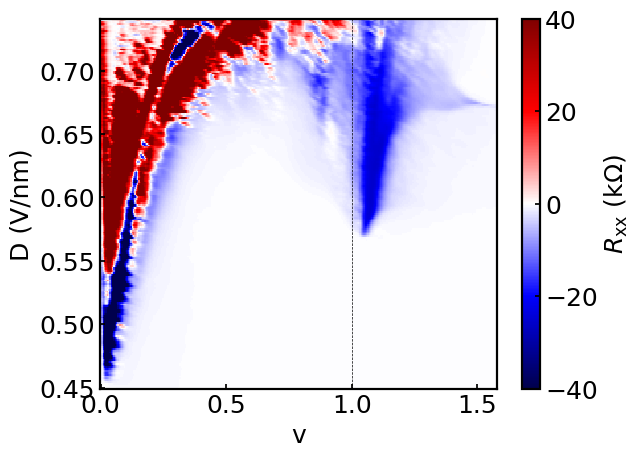

In [94]:
r_hc_x_2D_neg0p1 = np.array(database['v_hc_x_2d'])/1000/1e-9/1e3
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_hc_x_2D_neg0p1, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

In [ ]:
#Symmetrize and antisymmetrize

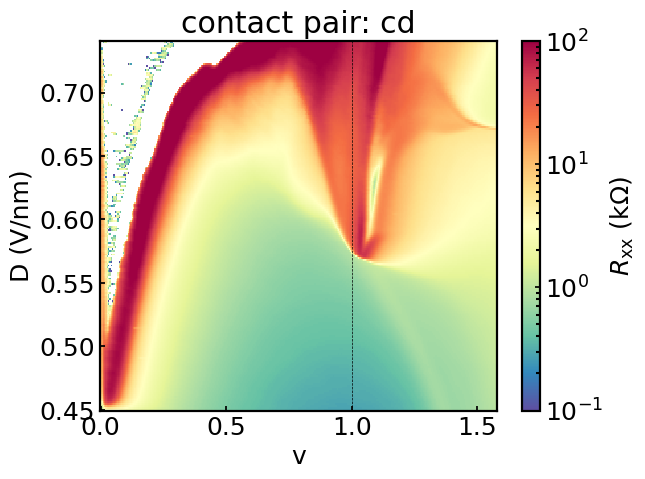

In [104]:
r_cd_x_2D_sym = (r_cd_x_2D_pos0p1 + r_cd_x_2D_neg0p1)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_cd_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

plt.title('contact pair: cd')

fname = './2Dmapv=1_100mk_B=0.1T/nD_rxx_symmetrized_log_cd.png'
plt.savefig(fname, bbox_inches = 'tight')

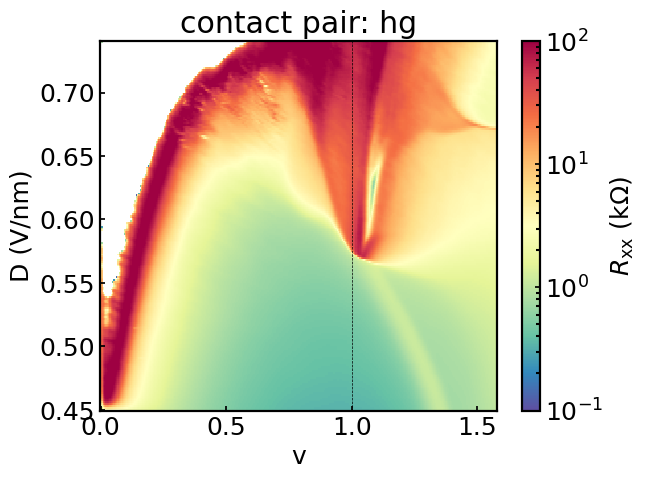

In [105]:
r_hg_x_2D_sym = (r_hg_x_2D_pos0p1 + r_hg_x_2D_neg0p1)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_hg_x_2D_sym, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

plt.title('contact pair: hg')

fname = './2Dmapv=1_100mk_B=0.1T/nD_rxx_symmetrized_log_hg.png'
plt.savefig(fname, bbox_inches = 'tight')

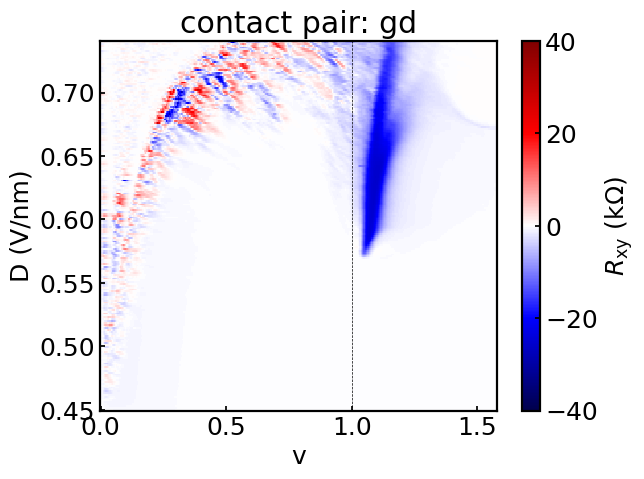

In [108]:
r_gd_x_2D_antisym = (r_gd_x_2D_pos0p1 - r_gd_x_2D_neg0p1)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, r_gd_x_2D_antisym, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xy}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

plt.title('contact pair: gd')

fname = './2Dmapv=1_100mk_B=0.1T/nD_rxy_antisymmetrized_gd.png'
plt.savefig(fname, bbox_inches = 'tight')

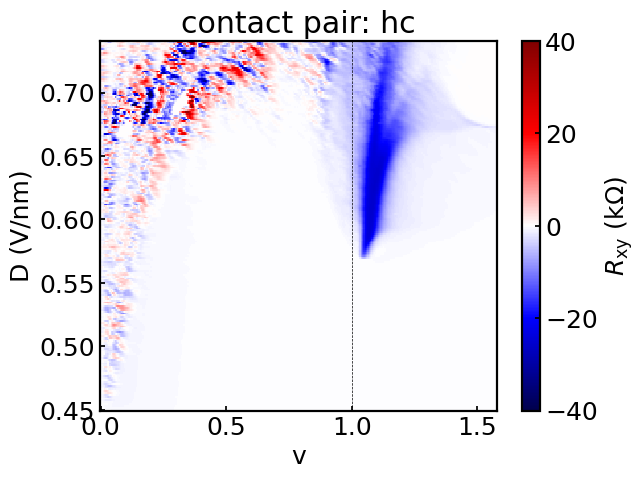

In [112]:
r_hc_x_2D_antisym = (r_hc_x_2D_pos0p1 - r_hc_x_2D_neg0p1)/2
# print(r_gd_x_2D[0])

# plot 2D gate map

slow_D = np.linspace(0.74, 0.45, num = 200)
fast_n = np.linspace(0, 1, num = 300)

ff = 2.54
v = (fast_n/ff)*4

xv, yv = np.meshgrid(fast_n, slow_D)
xv_v, yv_v = np.meshgrid(v, slow_D)

fig, ax = plt.subplots()

ax.set_ylabel('D (V/nm)')
ax.set_xlabel('v')

c = ax.pcolormesh(xv_v, yv_v, -1*r_hc_x_2D_antisym, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xy}\ \mathrm{(k\Omega)}$')

ax.axvline(1, 0, 1, c = 'k', linestyle = '--', linewidth = 0.5)

plt.title('contact pair: hc')

fname = './2Dmapv=1_100mk_B=0.1T/nD_rxy_antisymmetrized_hc.png'
plt.savefig(fname, bbox_inches = 'tight')

In [ ]:
#Landau fans n = -0.5 to 3

In [5]:
database = []

for i in range(261, 513):
    if i != 466:
        database.append(h5py.File('./LFs_n=-0.5to3/dat' + str(i) +'.h5', 'r'))
    
list(database[0].keys())

['metadata',
 'v_cd_x_2d',
 'v_cd_y_2d',
 'v_gd_x_2d',
 'v_gd_y_2d',
 'v_hc_x_2d',
 'v_hc_y_2d',
 'v_hg_x_2d',
 'v_hg_y_2d']

Text(0.5, 1.0, '0.6 V/nm')

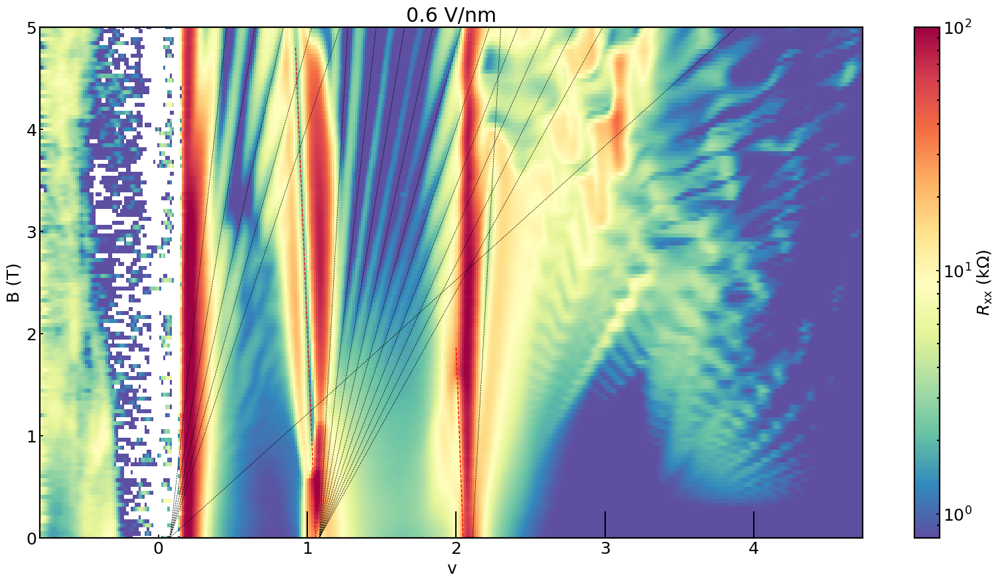

In [114]:
#plot Landau fan at 0.6V/nm, rxx

r_cd_x_2D = []
for i in range(0, len(database)):
    r_cd_x_2D.append(database[i]['v_cd_x_2d'][2]/1000/1e-9/1e3)

# r_cd_x_2D = np.array(r_cd_x_2D)

# print(r_cd_x_2D.shape)

r_cd_x_2D_sym_top = (r_cd_x_2D[126:] + np.flip(r_cd_x_2D[0:125], 0))/2
r_cd_x_2D_sym_bottom = (r_cd_x_2D[126:] + np.flip(r_cd_x_2D[0:125], 0))/2
r_cd_x_2D_sym = np.concatenate((np.flip(r_cd_x_2D_sym_bottom, axis = 0), r_cd_x_2D_sym_top), axis = 0)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(0, 5, num = 126)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('v')
ax.set_xticks([0, 2.54/4, 2.54/2, 2.54*(3/4), 2.54], labels = ["0", "1", "2", "3", "4"])
ax.set_ylim(0, 5)
# ax.set_xlim(0, 2)

c = ax.pcolormesh(xv, yv, r_cd_x_2D[125:], cmap = 'Spectral_r', norm = 'log', vmin = 8e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(1.27, 1.6, 100)
y1 = (x1 - 1.3)*(Phi_0*1e-2)*(-3/2)
# x2 = np.linspace(0.57, 0.672, 100)
# y2 = (x2 - 0.672)*(Phi_0*1e-2)*(-1)
x3 = np.linspace(0.585, 1, 100)
y3 = (x3 - 0.672)*(Phi_0*1e-2)*(-4/3)
x4 = np.linspace(1.34, 1.9, 100)
y4 = (x4 - 1.34)*(Phi_0*1e-2)*(1)
x5 = np.linspace(0.687, 2, 100)
y5 = (x5 - 0.687)*(Phi_0*1e-2)*(1)
x6 = np.linspace(0.687, 2, 100)
y6 = (x6 - 0.687)*(Phi_0*1e-2)*(1/2)
x7 = np.linspace(0.687, 2, 100)
y7 = (x7 - 0.687)*(Phi_0*1e-2)*(1/3)
x8 = np.linspace(0.687, 2, 100)
y8 = (x8 - 0.687)*(Phi_0*1e-2)*(1/4)
x9 = np.linspace(0.687, 2, 100)
y9 = (x9 - 0.687)*(Phi_0*1e-2)*(1/5)
x10 = np.linspace(0.687, 2, 100)
y10 = (x10 - 0.687)*(Phi_0*1e-2)*(1/6)
x11 = np.linspace(0.687, 2, 100)
y11 = (x11 - 0.687)*(Phi_0*1e-2)*(1/7)

x12 = np.linspace(0.05, 1, 100)
y12 = (x12 - 0.05)*(Phi_0*1e-2)*(1/2)
x13 = np.linspace(0.05, 1, 100)
y13 = (x13 - 0.05)*(Phi_0*1e-2)*(1/4)
x14 = np.linspace(0.05, 1, 100)
y14 = (x14 - 0.05)*(Phi_0*1e-2)*(1/5)
x15 = np.linspace(0.05, 1, 100)
y15 = (x15 - 0.05)*(Phi_0*1e-2)*(1/6)
x16 = np.linspace(0.05, 1, 100)
y16 = (x16 - 0.05)*(Phi_0*1e-2)*(1/3)

x17 = np.linspace(0, 3, 100)
y17 = (x17 - 1.95)*(Phi_0*1e-2)*(-1)
x18 = np.linspace(0, 3, 100)
y18 = (x18 - 1.95)*(Phi_0*1e-2)*(-1/2)
x19 = np.linspace(0, 3, 100)
y19 = (x19 - 1.95)*(Phi_0*1e-2)*(-1/3)
x20 = np.linspace(0, 3, 100)
y20 = (x20 - 1.95)*(Phi_0*1e-2)*(-1/4)


x21 = np.linspace(0, 3, 100)
y21 = (x21 - 0.687)*(Phi_0*1e-2)*(1/8)
x22 = np.linspace(0, 3, 100)
y22 = (x22 - 0.687)*(Phi_0*1e-2)*(1/9)
x23 = np.linspace(0, 3, 100)
y23 = (x23 - 0.687)*(Phi_0*1e-2)*(1/10)
x24 = np.linspace(0, 3, 100)
y24 = (x24 - 0.05)*(Phi_0*1e-2)*(1/20)

# x1 = np.linspace(0, 3, 100)
# y1 = (x1 - 2.54/2)*(Phi_0*1e-2)*(-3/2)
# # x2 = np.linspace(0.57, 0.672, 100)
# # y2 = (x2 - 0.672)*(Phi_0*1e-2)*(-1)
# x3 = np.linspace(0, 3, 100)
# y3 = (x3 - 2.54/4)*(Phi_0*1e-2)*(-4/3)
# x4 = np.linspace(0, 3, 100)
# y4 = (x4 - 2.54/2)*(Phi_0*1e-2)*(1)
# x5 = np.linspace(0, 3, 100)
# y5 = (x5 - 2.54/4)*(Phi_0*1e-2)*(1)
# x6 = np.linspace(0, 3, 100)
# y6 = (x6 - 2.54/4)*(Phi_0*1e-2)*(1/2)
# x7 = np.linspace(0, 3, 100)
# y7 = (x7 - 2.54/4)*(Phi_0*1e-2)*(1/3)
# x8 = np.linspace(0, 3, 100)
# y8 = (x8 - 2.54/4)*(Phi_0*1e-2)*(1/4)
# x9 = np.linspace(0, 3, 100)
# y9 = (x9 - 2.54/4)*(Phi_0*1e-2)*(1/5)
# x10 = np.linspace(0, 3, 100)
# y10 = (x10 - 2.54/4)*(Phi_0*1e-2)*(1/6)
# x11 = np.linspace(0, 3, 100)
# y11 = (x11 - 2.54/4)*(Phi_0*1e-2)*(1/7)

# x12 = np.linspace(0, 3, 100)
# y12 = (x12 - 0)*(Phi_0*1e-2)*(1/2)
# x13 = np.linspace(0, 3, 100)
# y13 = (x13 - 0)*(Phi_0*1e-2)*(1/4)
# x14 = np.linspace(0, 3, 100)
# y14 = (x14 - 0)*(Phi_0*1e-2)*(1/5)
# x15 = np.linspace(0, 3, 100)
# y15 = (x15 - 0)*(Phi_0*1e-2)*(1/6)
# x16 = np.linspace(0, 3, 100)
# y16 = (x16 - 0)*(Phi_0*1e-2)*(1/3)

# x17 = np.linspace(0, 3, 100)
# y17 = (x17 - 1.95)*(Phi_0*1e-2)*(-1)
# x18 = np.linspace(0, 3, 100)
# y18 = (x18 - 1.95)*(Phi_0*1e-2)*(-1/2)
# x19 = np.linspace(0, 3, 100)
# y19 = (x19 - 1.95)*(Phi_0*1e-2)*(-1/3)
# x20 = np.linspace(0, 3, 100)
# y20 = (x20 - 1.95)*(Phi_0*1e-2)*(-1/4)


# x21 = np.linspace(0, 3, 100)
# y21 = (x21 - 2.54/4)*(Phi_0*1e-2)*(1/8)
# x22 = np.linspace(0, 3, 100)
# y22 = (x22 - 2.54/4)*(Phi_0*1e-2)*(1/9)
# x23 = np.linspace(0, 3, 100)
# y23 = (x23 - 2.54/4)*(Phi_0*1e-2)*(1/10)



ax.plot(x1, y1, 'r--', linewidth=1)
# ax.plot(x2, y2, 'k--', linewidth=0.9)
ax.plot(x3, y3, 'r--', linewidth=1)
ax.plot(x4, y4, 'k--', linewidth=0.5)
ax.plot(x5, y5, 'k--', linewidth=0.5)
ax.plot(x6, y6, 'k--', linewidth=0.5)
ax.plot(x7, y7, 'k--', linewidth=0.5)
ax.plot(x8, y8, 'k--', linewidth=0.5)
ax.plot(x9, y9, 'k--', linewidth=0.5)
ax.plot(x10, y10, 'k--', linewidth=0.5)
ax.plot(x11, y11, 'k--', linewidth=0.5)
ax.plot(x12, y12, 'k--', linewidth=0.5)
ax.plot(x13, y13, 'k--', linewidth=0.5)
ax.plot(x14, y14, 'k--', linewidth=0.5)
ax.plot(x15, y15, 'k--', linewidth=0.5)
ax.plot(x16, y16, 'k--', linewidth=0.5)
# ax.plot(x17, y17, 'k--', linewidth=0.9)
# ax.plot(x18, y18, 'k--', linewidth=0.9)
# ax.plot(x19, y19, 'k--', linewidth=0.9)
# ax.plot(x20, y20, 'k--', linewidth=0.9)
ax.plot(x21, y21, 'k--', linewidth=0.5)
ax.plot(x22, y22, 'k--', linewidth=0.5)
ax.plot(x23, y23, 'k--', linewidth=0.5)
ax.plot(x24, y24, 'k--', linewidth=0.5)


ax.axvline(2.54/4, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54/2, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54*(3/4), 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)


plt.title('0.6 V/nm')

# fname = './LFs_n=-0p5to3_figures/0p6vnm_rxx_withfits_fiteverything_stuckat1,0and2.png'
# plt.savefig(fname, bbox_inches = 'tight')

Text(0.5, 1.0, '0.6 V/nm')

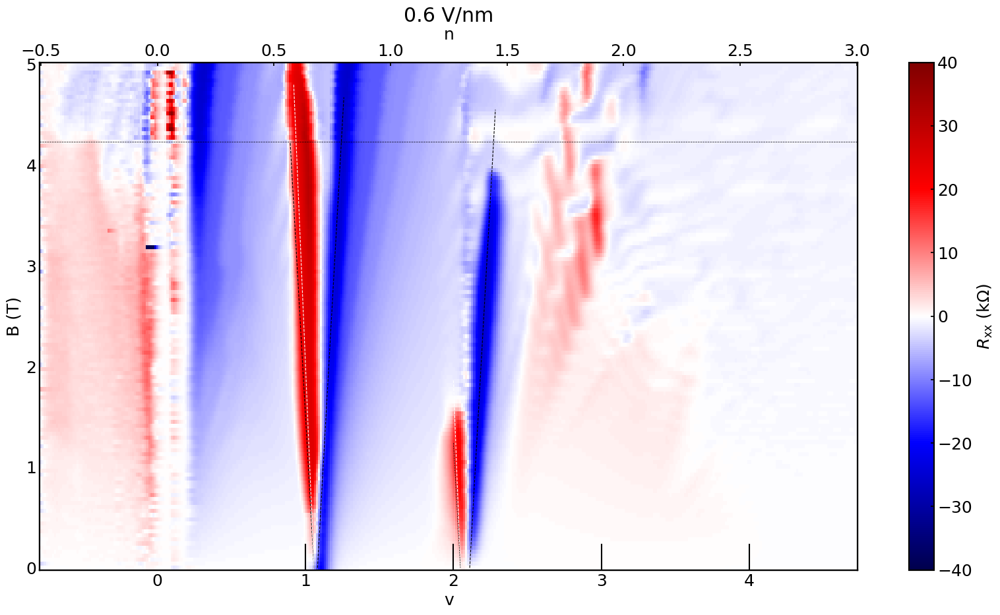

In [195]:
#plot Landau fan at 0.6V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][2]/1000/1e-9/1e3)

# r_gd_x_2D = np.array(r_cd_x_2D)

# print(r_cd_x_2D.shape)

r_gd_x_2D_antisym_top = (r_gd_x_2D[126:] - np.flip(r_gd_x_2D[0:125], 0))/2
r_gd_x_2D_antisym_bottom = -(r_gd_x_2D[126:] - np.flip(r_gd_x_2D[0:125], 0))/2
# r_gd_x_2D_sym = np.concatenate((np.flip(r_gd_x_2D_sym_bottom, axis = 0), r_gd_x_2D_sym_top), axis = 0)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(0, 5, num = 125)

# print(B[125])
# print(B[126])

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax2 = plt.subplots(figsize = (20, 10))

ax2.set_ylabel('B (T)')
ax2.set_xlabel('v')

ax = ax2.twiny()
ax.set_xlabel('n')
ax2.set_xticks([0, 1, 2, 3, 4])

c = ax2.pcolormesh(xv_v, yv_v, r_gd_x_2D_antisym_top, cmap = 'seismic', vmin = -40, vmax = 40)
ax.pcolormesh(xv, yv, r_gd_x_2D_antisym_top, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(1.27, 1.3, 100)
y1 = (x1 - 1.3)*(Phi_0*1e-2)*(-3/2)
x2 = np.linspace(0.57, 0.672, 100)
y2 = (x2 - 0.672)*(Phi_0*1e-2)*(-1)
x3 = np.linspace(0.585, 0.672, 100)
y3 = (x3 - 0.672)*(Phi_0*1e-2)*(-4/3)
x4 = np.linspace(1.34, 1.45, 100)
y4 = (x4 - 1.34)*(Phi_0*1e-2)*(1)
x5 = np.linspace(0.687, 0.8, 100)
y5 = (x5 - 0.687)*(Phi_0*1e-2)*(1)
x6 = np.linspace(1.27, 1.3, 100)
y6 = (x6 - 1.3)*(Phi_0*1e-2)*(-1)


ax.plot(x1, y1, 'w--', linewidth=0.8)
ax.plot(x2, y2, 'k--', linewidth=0.8)
ax.plot(x3, y3, 'w--', linewidth=0.8)
ax.plot(x4, y4, 'k--', linewidth=0.8)
ax.plot(x5, y5, 'k--', linewidth=0.8)
ax.plot(x6, y6, 'k--', linewidth=0.5)

ax.axhline(4.23, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
# ax.axhline(0.4, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.axvline(0.635, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(1.27, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54*(3/4), 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)


plt.title('0.6 V/nm')

# fname = './LFv=1figures/0p58vnm_rxx.png'
# plt.savefig(fname, bbox_inches = 'tight')

4.233870967741935


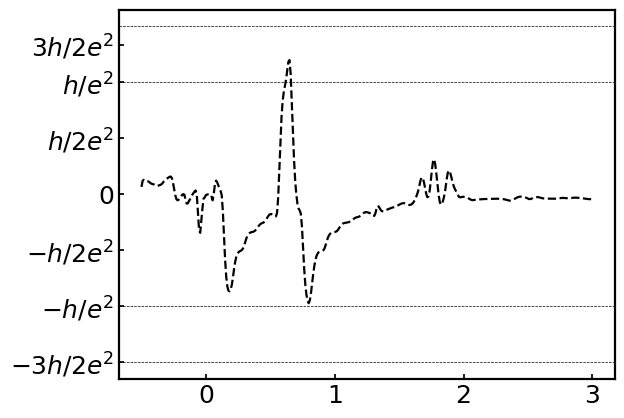

In [191]:
#line cuts
print(B[105])

fig, ax = plt.subplots()

ax.plot(n, r_gd_x_2D_antisym_top[100]/25.8, 'k--')
ax.axhline(-3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(-1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_yticks([(4/3), 1, 1/2, 0, -1/2, -1, -(3/2)], ["$3h/2e^2$", "$h/e^2$", "$h/2e^2$", "$0$", "$-h/2e^2$", "$-h/e^2$", "$-3h/2e^2$"])

0.4032258064516129


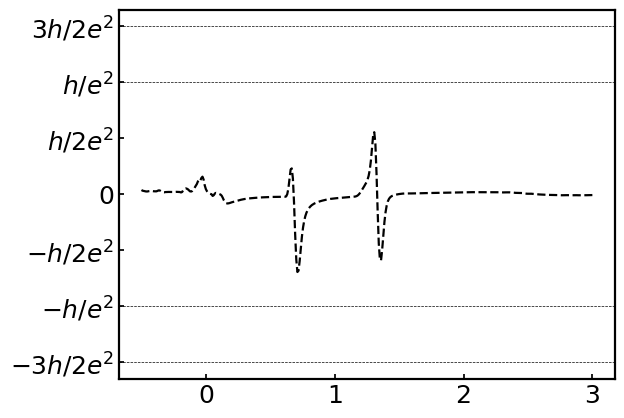

In [106]:
#line cuts
print(B[10])

fig, ax = plt.subplots()

ax.plot(n, r_gd_x_2D_antisym_top[10]/25.8, 'k--')
ax.axhline(-3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(-1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_yticks([(3/2), 1, 1/2, 0, -1/2, -1, -(3/2)], ["$3h/2e^2$", "$h/e^2$", "$h/2e^2$", "$0$", "$-h/2e^2$", "$-h/e^2$", "$-3h/2e^2$"])

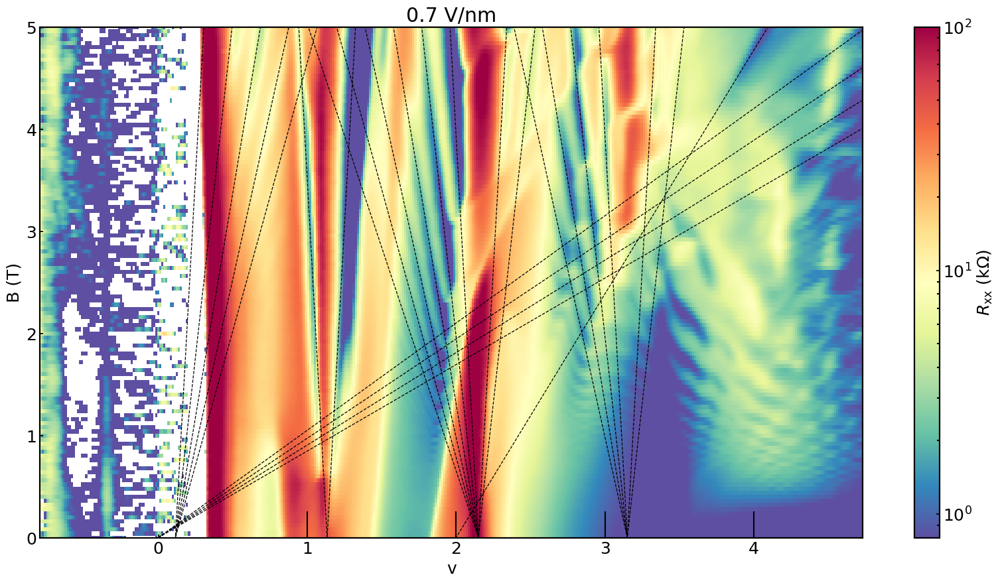

In [118]:
#plot Landau fan at 0.7V/nm, rxx

r_cd_x_2D = []
for i in range(0, len(database)):
    r_cd_x_2D.append(database[i]['v_cd_x_2d'][3]/1000/1e-9/1e3)

# r_cd_x_2D = np.array(r_cd_x_2D)

# print(r_cd_x_2D.shape)

r_cd_x_2D_sym_top = (r_cd_x_2D[126:] + np.flip(r_cd_x_2D[0:125], 0))/2
r_cd_x_2D_sym_bottom = (r_cd_x_2D[126:] + np.flip(r_cd_x_2D[0:125], 0))/2
r_cd_x_2D_sym = np.concatenate((np.flip(r_cd_x_2D_sym_bottom, axis = 0), r_cd_x_2D_sym_top), axis = 0)
    
D = 0.7
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(0, 5, num = 126)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('v')

# ax.set_xticks([0, 0.073, 2.54/4, 2.54/4 + 0.073, 2.54/2, 2.54/2 + 0.073, 2.54*(3/4), 2.54*(3/4) + 0.073, 2.54, 2.54 + 0.073], 
#               labels = ["0", "0n", "1", "1n", "2", "2n", "3", "3n", "4", "4n"])
ax.set_xticks([0, 2.54/4, 2.54/2, 2.54*(3/4), 2.54], 
              labels = ["0", "1", "2", "3", "4"])
ax.set_ylim(0, 5)
# ax.set_xlim(0, 2)

c = ax.pcolormesh(xv, yv, r_cd_x_2D[125:], cmap = 'Spectral_r', norm = 'log', vmin = 8e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(0, 3, 100)
y1 = (x1 - 0.073)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0, 3, 100)
y2 = (x2 - 0.073)*(Phi_0*1e-2)*(1/2)
x3 = np.linspace(0, 3, 100)
y3 = (x3 - 0.073)*(Phi_0*1e-2)*(1/3)
x4 = np.linspace(0, 3, 100)
y4 = (x4 - 0.073)*(Phi_0*1e-2)*(1/4)
x5 = np.linspace(0, 3, 100)
y5 = (x5 - 0.073)*(Phi_0*1e-2)*(1/5)
x6 = np.linspace(0, 3, 100)
y6 = (x6 - 0.72)*(Phi_0*1e-2)*(-1)
x7 = np.linspace(0, 3, 100)
y7 = (x7 - 0.72)*(Phi_0*1e-2)*(1)
x8 = np.linspace(0, 3, 100)
y8 = (x8 - 1.365)*(Phi_0*1e-2)*(1)
x9 = np.linspace(0, 3, 100)
y9 = (x9 - 1.365)*(Phi_0*1e-2)*(1/2)
x10 = np.linspace(0, 3, 100)
y10 = (x10 - 1.365)*(Phi_0*1e-2)*(-1)
x11 = np.linspace(0, 3, 100)
y11 = (x11 - 1.365)*(Phi_0*1e-2)*(-1/2)
x12 = np.linspace(0, 3, 100)
y12 = (x12 - 1.365)*(Phi_0*1e-2)*(-1/3)
x13 = np.linspace(0, 3, 100)
y13 = (x13 - 1.365)*(Phi_0*1e-2)*(-1/4)
x14 = np.linspace(0, 3, 100)
y14 = (x14 - 1.365)*(Phi_0*1e-2)*(-1/5)
x15 = np.linspace(0, 3, 100)
y15 = (x15 - 1.365)*(Phi_0*1e-2)*(-1/6)
x16 = np.linspace(0, 3, 100)
y16 = (x16 - 2)*(Phi_0*1e-2)*(-1)
x17 = np.linspace(0, 3, 100)
y17 = (x17 - 2)*(Phi_0*1e-2)*(-1/2)
x18 = np.linspace(0, 3, 100)
y18 = (x18 - 2)*(Phi_0*1e-2)*(-1/3)
x19 = np.linspace(0, 3, 100)
y19 = (x19 - 2)*(Phi_0*1e-2)*(-1/4)
x20 = np.linspace(0, 3, 100)
y20 = (x20 - 2)*(Phi_0*1e-2)*(1)
x21 = np.linspace(0, 3, 100)
y21 = (x21 - 2)*(Phi_0*1e-2)*(1/2)
x22 = np.linspace(0, 3, 100)
y22 = (x22 - 1.27)*(Phi_0*1e-2)*(1/11)
x23 = np.linspace(0, 3, 100)
y23 = (x23 - 0)*(Phi_0*1e-2)*(1/25)
x24 = np.linspace(0, 3, 100)
y24 = (x23 - 0)*(Phi_0*1e-2)*(1/27)
x25 = np.linspace(0, 3, 100)
y25 = (x23 - 0)*(Phi_0*1e-2)*(1/29)
x26 = np.linspace(0, 3, 100)
y26 = (x23 - 0)*(Phi_0*1e-2)*(1/31)




ax.plot(x1, y1, 'k--', linewidth=0.9)
ax.plot(x2, y2, 'k--', linewidth=0.9)
ax.plot(x3, y3, 'k--', linewidth=0.9)
ax.plot(x4, y4, 'k--', linewidth=0.9)
ax.plot(x5, y5, 'k--', linewidth=0.9)
ax.plot(x6, y6, 'k--', linewidth=0.9)
ax.plot(x7, y7, 'k--', linewidth=0.9)
ax.plot(x8, y8, 'k--', linewidth=0.9)
ax.plot(x9, y9, 'k--', linewidth=0.9)
ax.plot(x10, y10, 'k--', linewidth=0.9)
ax.plot(x11, y11, 'k--', linewidth=0.9)
ax.plot(x12, y12, 'k--', linewidth=0.9)
ax.plot(x13, y13, 'k--', linewidth=0.9)
ax.plot(x14, y14, 'k--', linewidth=0.9)
ax.plot(x15, y15, 'k--', linewidth=0.9)
ax.plot(x16, y16, 'k--', linewidth=0.9)
ax.plot(x17, y17, 'k--', linewidth=0.9)
ax.plot(x18, y18, 'k--', linewidth=0.9)
ax.plot(x19, y19, 'k--', linewidth=0.9)
ax.plot(x20, y20, 'k--', linewidth=0.9)
ax.plot(x21, y21, 'k--', linewidth=0.9)
ax.plot(x22, y22, 'k--', linewidth=0.9)
ax.plot(x23, y23, 'k--', linewidth=0.9)
ax.plot(x24, y24, 'k--', linewidth=0.9)
ax.plot(x25, y25, 'k--', linewidth=0.9)
ax.plot(x26, y26, 'k--', linewidth=0.9)


ax.axvline(2.54/4, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54/2, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54*(3/4), 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)

plt.title('0.7 V/nm')

fname = './LFs_n=-0p5to3_figures/0p7vnm_rxx_everythingfit.png'
plt.savefig(fname, bbox_inches = 'tight')

In [71]:
B = np.linspace(-5, 5, num = 251)
print(B[125])

0.0


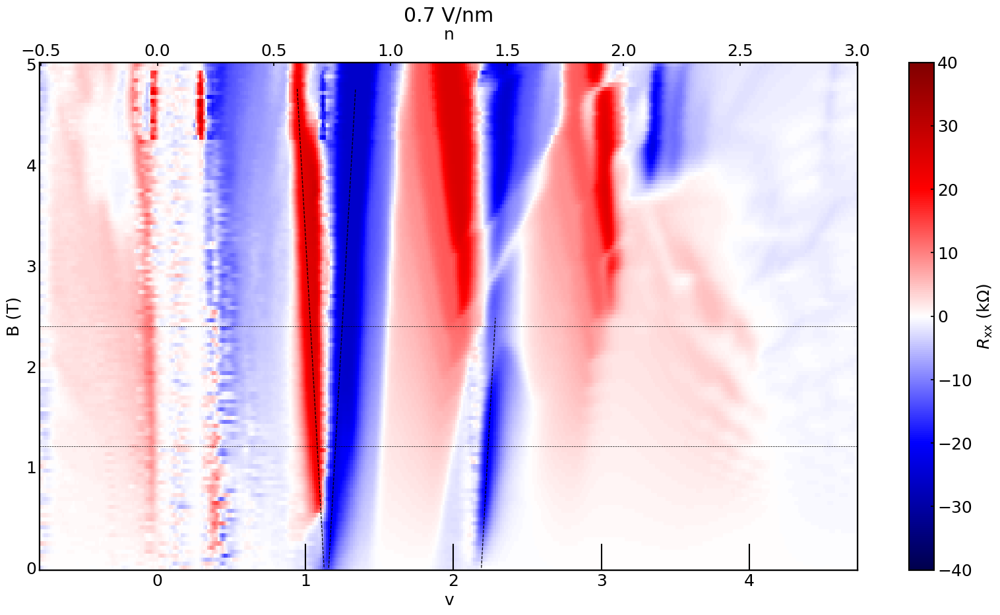

In [231]:
#plot Landau fan at 0.7V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][3]/1000/1e-9/1e3)

# r_gd_x_2D = np.array(r_cd_x_2D)

# print(r_cd_x_2D.shape)

# r_gd_x_2D_antisym_top = np.zeros((126, 400))

# r_gd_x_2D_antisym_top[0] = r_gd_x_2D[125]
r_gd_x_2D_antisym_top = (r_gd_x_2D[126:] - np.flip(r_gd_x_2D[0:125], 0))/2
r_gd_x_2D_antisym_bottom = -(r_gd_x_2D[126:] - np.flip(r_gd_x_2D[0:125], 0))/2
# r_gd_x_2D_sym = np.concatenate((np.flip(r_gd_x_2D_sym_bottom, axis = 0), r_gd_x_2D_sym_top), axis = 0)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(0, 5, num = 125)

# print(B[125])
# print(B[126])

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax2 = plt.subplots(figsize = (20, 10))

ax2.set_ylabel('B (T)')
ax2.set_xlabel('v')

ax = ax2.twiny()
ax.set_xlabel('n')
ax2.set_xticks([0, 1, 2, 3, 4])

c = ax2.pcolormesh(xv_v, yv_v, r_gd_x_2D_antisym_top, cmap = 'seismic', vmin = -40, vmax = 40)
ax.pcolormesh(xv, yv, r_gd_x_2D_antisym_top, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(1.39, 1.45, 100)
y1 = (x1 - 1.39)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0.6, 0.715, 100)
y2 = (x2 - 0.715)*(Phi_0*1e-2)*(-1)
x3 = np.linspace(0.62, 0.698, 100)
y3 = (x3 - 0.698)*(Phi_0*1e-2)*(-4/3)
x4 = np.linspace(0.735, 0.85, 100)
y4 = (x4 - 0.735)*(Phi_0*1e-2)*(1)
x5 = np.linspace(0.77, 0.85, 100)
y5 = (x5 - 0.77)*(Phi_0*1e-2)*(3/2)
x6 = np.linspace(0.73, 0.9, 100)
y6 = (x6 - 0.7)*(Phi_0*1e-2)*(1/2)
x7 = np.linspace(0.7, 0.98, 100)
y7 = (x7 - 0.7)*(Phi_0*1e-2)*(1/3)
x8 = np.linspace(0.7, 1.02, 100)
y8 = (x8 - 0.7)*(Phi_0*1e-2)*(1/4)
x9 = np.linspace(0.7, 1.04, 100)
y9 = (x9 - 0.7)*(Phi_0*1e-2)*(1/5)
x10 = np.linspace(0.7, 1.08, 100)
y10 = (x10 - 0.7)*(Phi_0*1e-2)*(1/6)
x11 = np.linspace(0.7, 1.15, 100)
y11 = (x11 - 0.7)*(Phi_0*1e-2)*(1/7)


ax.plot(x1, y1, 'k--', linewidth=0.9)
ax.plot(x2, y2, 'k--', linewidth=0.9)
# ax.plot(x3, y3, 'r--', linewidth=0.9)
ax.plot(x4, y4, 'k--', linewidth=0.9)
# ax.plot(x5, y5, 'r--', linewidth=0.9)
# ax.plot(x6, y6, 'k--', linewidth=0.9)
# ax.plot(x7, y7, 'k--', linewidth=0.9)
# ax.plot(x8, y8, 'k--', linewidth=0.9)
# ax.plot(x9, y9, 'k--', linewidth=0.9)
# ax.plot(x10, y10, 'k--', linewidth=0.9)
# ax.plot(x11, y11, 'k--', linewidth=0.9)


ax.axhline(2.4, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(1.21, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.axvline(0.635, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(1.27, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54*(3/4), 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)


plt.title('0.7 V/nm')

fname = './LFs_n=-0p5to3_figures/0p7vnm_rxyantisym_withfits.png'
plt.savefig(fname, bbox_inches = 'tight')

2.4193548387096775


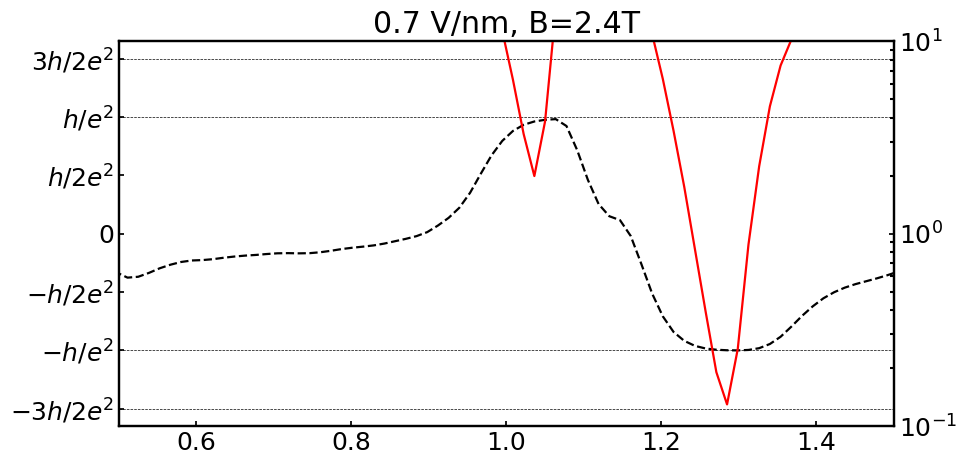

In [251]:
#line cuts
print(B[60])

fig, ax = plt.subplots(figsize = (10, 5))
ax.set_xlim(0.5, 1.5)
ax2 = ax.twinx()
ax2.set_ylim(1e-1, 1e1)
ax2.set_yscale('log')

ax.plot(v, r_gd_x_2D_antisym_top[60]/25.8, 'k--')
ax2.plot(v, r_cd_x_2D_sym_top[60], 'r-')
ax.axhline(-3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(-1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_yticks([(3/2), 1, 1/2, 0, -1/2, -1, -(3/2)], ["$3h/2e^2$", "$h/e^2$", "$h/2e^2$", "$0$", "$-h/2e^2$", "$-h/e^2$", "$-3h/2e^2$"])

plt.title('0.7 V/nm, B=2.4T')

fname = './LFs_n=-0p5to3_figures/0p7vnm_rxyantisym_representativetrace_B=2p4T.png'
plt.savefig(fname, bbox_inches = 'tight')

1.2096774193548387


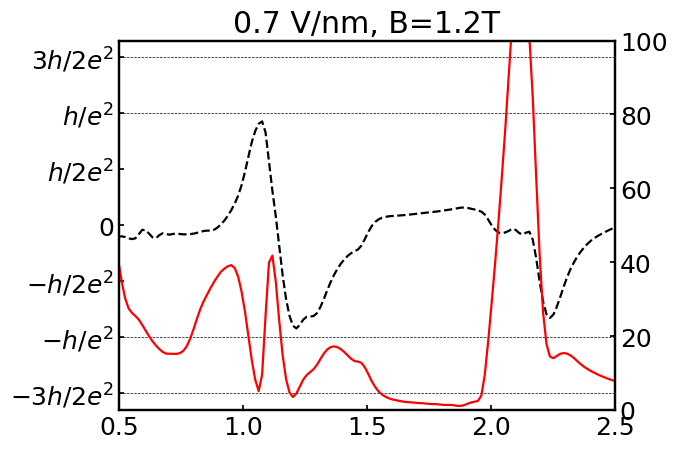

In [248]:
#line cuts
print(B[30])

fig, ax = plt.subplots()

ax.set_xlim(0.5, 2.5)
ax2 = ax.twinx()
ax2.set_ylim(0, 100)

ax.plot(v, r_gd_x_2D_antisym_top[30]/25.8, 'k--')
ax2.plot(v, r_cd_x_2D_sym_top[30], 'r-')
ax.axhline(-3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(-1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_yticks([(3/2), 1, 1/2, 0, -1/2, -1, -(3/2)], ["$3h/2e^2$", "$h/e^2$", "$h/2e^2$", "$0$", "$-h/2e^2$", "$-h/e^2$", "$-3h/2e^2$"])

plt.title('0.7 V/nm, B=1.2T')

fname = './LFs_n=-0p5to3_figures/0p7vnm_rxyantisym_representativetrace_B=1p2T.png'
plt.savefig(fname, bbox_inches = 'tight')

1.411290322580645


Text(0.5, 1.0, '0.7 V/nm, B=1.2T')

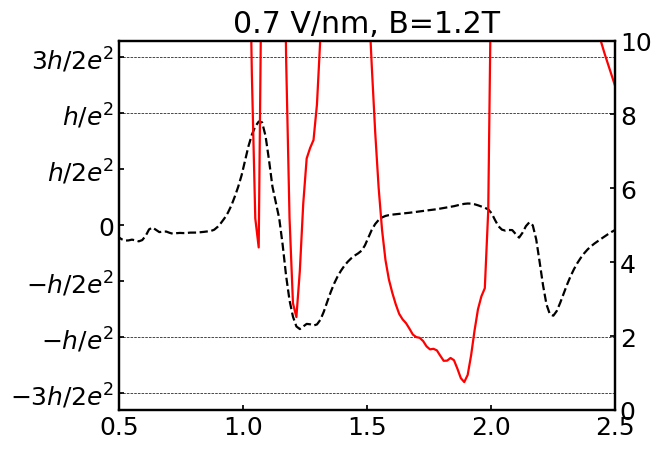

In [247]:
#line cuts
print(B[35])

fig, ax = plt.subplots()

ax.set_xlim(0.5, 2.5)
ax2 = ax.twinx()
ax2.set_ylim(0, 10)

ax.plot(v, r_gd_x_2D_antisym_top[35]/25.8, 'k--')
ax2.plot(v, r_cd_x_2D_sym_top[35], 'r-')
ax.axhline(-3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(-1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(3/2, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)
ax.axhline(1, 0,  1, c = 'k', linestyle = '--', linewidth = 0.5)

ax.set_yticks([(3/2), 1, 1/2, 0, -1/2, -1, -(3/2)], ["$3h/2e^2$", "$h/e^2$", "$h/2e^2$", "$0$", "$-h/2e^2$", "$-h/e^2$", "$-3h/2e^2$"])

plt.title('0.7 V/nm, B=1.2T')

# fname = './LFs_n=-0p5to3_figures/0p7vnm_rxyantisym_representativetrace_B=1p8T.png'
# plt.savefig(fname, bbox_inches = 'tight')

Text(0.5, 1.0, '0.8 V/nm')

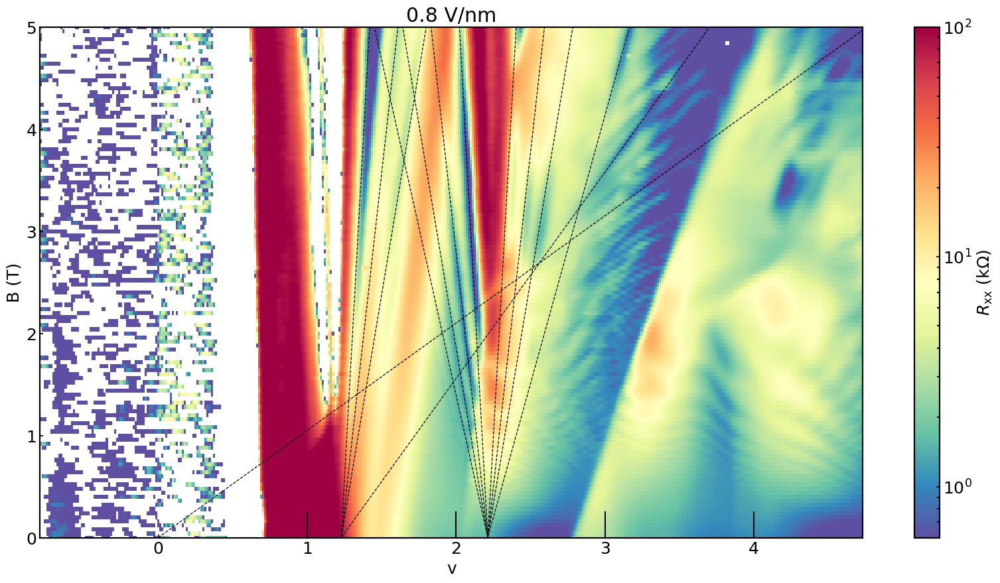

In [165]:
#plot Landau fan at 0.8V/nm, rxx

r_cd_x_2D = []
for i in range(0, len(database)):
    r_cd_x_2D.append(database[i]['v_cd_x_2d'][4]/1000/1e-9/1e3)

# r_cd_x_2D = np.array(r_cd_x_2D)

# print(r_cd_x_2D.shape)

r_cd_x_2D_sym_top = (r_cd_x_2D[126:] + np.flip(r_cd_x_2D[0:125], 0))/2
r_cd_x_2D_sym_bottom = (r_cd_x_2D[126:] + np.flip(r_cd_x_2D[0:125], 0))/2
r_cd_x_2D_sym = np.concatenate((np.flip(r_cd_x_2D_sym_bottom, axis = 0), r_cd_x_2D_sym_top), axis = 0)
    
D = 0.8
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(0, 5, num = 126)

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('v')
ax.set_ylim(0, 5)

ax.set_xticks([0, 2.54/4, 2.54/2, 2.54*(3/4), 2.54], labels = ["0", "1", "2", "3", "4"])

c = ax.pcolormesh(xv, yv, r_cd_x_2D[125:], cmap = 'Spectral_r', norm = 'log', vmin = 6e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x1 = np.linspace(0, 3, 100)
y1 = (x1 - 0.78)*(Phi_0*1e-2)*(1)
x2 = np.linspace(0, 3, 100)
y2 = (x2 - 0.78)*(Phi_0*1e-2)*(1/2)
x3 = np.linspace(0, 3, 100)
y3 = (x3 - 0.78)*(Phi_0*1e-2)*(1/3)
x4 = np.linspace(0, 3, 100)
y4 = (x4 - 1.405)*(Phi_0*1e-2)*(-1)
x5 = np.linspace(0, 3, 100)
y5 = (x5 - 1.405)*(Phi_0*1e-2)*(-1/2)
x6 = np.linspace(0, 3, 100)
y6 = (x6 - 1.405)*(Phi_0*1e-2)*(-1/3)
x7 = np.linspace(0, 3, 100)
y7 = (x7 - 1.405)*(Phi_0*1e-2)*(-1/4)
x8 = np.linspace(0, 3, 100)
y8 = (x8 - 1.405)*(Phi_0*1e-2)*(1)
x9 = np.linspace(0, 3, 100)
y9 = (x9 - 1.405)*(Phi_0*1e-2)*(1/2)
x10 = np.linspace(0, 3, 100)
y10 = (x10 - 1.405)*(Phi_0*1e-2)*(1/3)
x11 = np.linspace(0, 3, 100)
y11 = (x11 - 1.405)*(Phi_0*1e-2)*(1/5)

x12 = np.linspace(0, 3, 100)
y12 = (x12 - 0.78)*(Phi_0*1e-2)*(1/13)
x13 = np.linspace(0, 3, 100)
y13 = (x13 - 0)*(Phi_0*1e-2)*(1/25)
x14 = np.linspace(0, 3, 100)
y14 = (x14 - 0)*(Phi_0*1e-2)*(1/24)
x15 = np.linspace(0, 3, 100)
y15 = (x15 - 0)*(Phi_0*1e-2)*(1/26)
x16 = np.linspace(0, 3, 100)
y16 = (x16 - 0)*(Phi_0*1e-2)*(1/23)
x17 = np.linspace(0, 3, 100)
y17 = (x17 - 0)*(Phi_0*1e-2)*(1/22)
x18 = np.linspace(0, 3, 100)
y18 = (x18 - 0)*(Phi_0*1e-2)*(1/21)
x19 = np.linspace(0, 3, 100)
y19 = (x19 - 0)*(Phi_0*1e-2)*(1/20)


ax.plot(x1, y1, 'k--', linewidth=0.9)
ax.plot(x2, y2, 'k--', linewidth=0.9)
ax.plot(x3, y3, 'k--', linewidth=0.9)
ax.plot(x4, y4, 'k--', linewidth=0.9)
ax.plot(x5, y5, 'k--', linewidth=0.9)
ax.plot(x6, y6, 'k--', linewidth=0.9)
ax.plot(x7, y7, 'k--', linewidth=0.9)
ax.plot(x8, y8, 'k--', linewidth=0.9)
ax.plot(x9, y9, 'k--', linewidth=0.9)
ax.plot(x10, y10, 'k--', linewidth=0.9)
ax.plot(x11, y11, 'k--', linewidth=0.9)
ax.plot(x12, y12, 'k--', linewidth=0.9)
ax.plot(x13, y13, 'k--', linewidth=0.9)
# ax.plot(x14, y14, 'k--', linewidth=0.9)
# ax.plot(x15, y15, 'k--', linewidth=0.9)
# ax.plot(x16, y16, 'k--', linewidth=0.9)
# ax.plot(x17, y17, 'k--', linewidth=0.9)
# ax.plot(x18, y18, 'k--', linewidth=0.9)
# ax.plot(x19, y19, 'k--', linewidth=0.9)

ax.axvline(2.54/4, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54/2, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54*(3/4), 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)
ax.axvline(2.54, 0,  0.05, c = 'k', linestyle = '-', linewidth = 1.5)


plt.title('0.8 V/nm')

# fname = './LFv=1figures/0p58vnm_rxx.png'
# plt.savefig(fname, bbox_inches = 'tight')

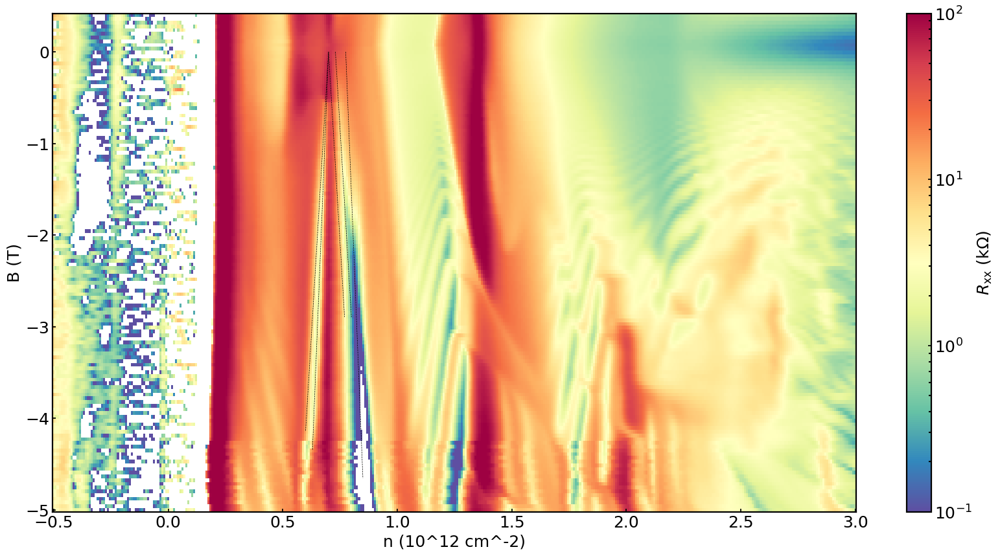

In [50]:
#plot Landau fan at 0.58V/nm, rxx

r_cd_x_2D = []
for i in range(0, len(database)):
    r_cd_x_2D.append(database[i]['v_cd_x_2d'][3]/1000/1e-9/1e3)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(-5, 0.4, num = len(database))

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_cd_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x3 = np.linspace(0.63, 0.7, 100)
y3 = (x3 - 0.7)*(Phi_0*1e-2)*(3/2)
x4 = np.linspace(0.7, 0.77, 100)
y4 = (x4 - 0.7)*(Phi_0*1e-2)*(-1)
x5 = np.linspace(0.6, 0.7, 100)
y5 = (x5 - 0.7)*(Phi_0*1e-2)*(1)
x6 = np.linspace(0.73, 0.8, 100)
y6 = (x6 - 0.73)*(Phi_0*1e-2)*(-1)
x7 = np.linspace(0.775, 0.85, 100)
y7 = (x7 - 0.775)*(Phi_0*1e-2)*(-3/2)


ax.plot(x3, y3, 'k--', linewidth=0.5)
ax.plot(x4, y4, 'k--', linewidth=0.5)
ax.plot(x5, y5, 'k--', linewidth=0.5)
ax.plot(x6, y6, 'k--', linewidth=0.5)
ax.plot(x7, y7, 'k--', linewidth=0.5)


# plt.title('0.58 V/nm')

# fname = './LFv=1figures/0p58vnm_rxx.png'
# plt.savefig(fname, bbox_inches = 'tight')

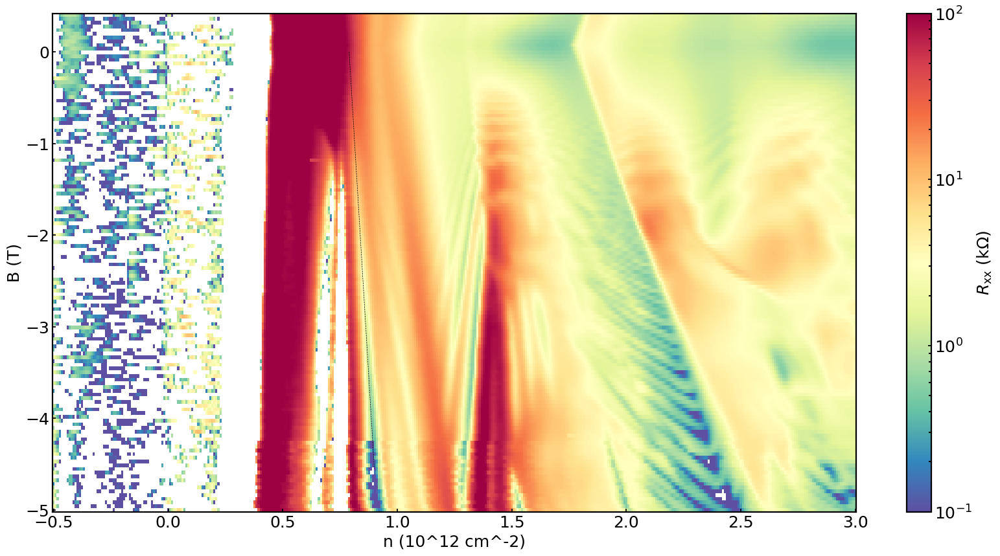

In [57]:
#plot Landau fan at 0.58V/nm, rxx

r_cd_x_2D = []
for i in range(0, len(database)):
    r_cd_x_2D.append(database[i]['v_cd_x_2d'][4]/1000/1e-9/1e3)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(-5, 0.4, num = len(database))

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_cd_x_2D, cmap = 'Spectral_r', norm = 'log', vmin = 1e-1, vmax = 1e2)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x3 = np.linspace(0.63, 0.7, 100)
y3 = (x3 - 0.7)*(Phi_0*1e-2)*(3/2)
x4 = np.linspace(0.79, 0.9, 100)
y4 = (x4 - 0.79)*(Phi_0*1e-2)*(-1)
x5 = np.linspace(0.6, 0.7, 100)
y5 = (x5 - 0.7)*(Phi_0*1e-2)*(1)
x6 = np.linspace(0.73, 0.8, 100)
y6 = (x6 - 0.73)*(Phi_0*1e-2)*(-1)
x7 = np.linspace(0.775, 0.85, 100)
y7 = (x7 - 0.775)*(Phi_0*1e-2)*(-3/2)


# ax.plot(x3, y3, 'k--', linewidth=0.5)
ax.plot(x4, y4, 'k--', linewidth=0.5)
# ax.plot(x5, y5, 'k--', linewidth=0.5)
# ax.plot(x6, y6, 'k--', linewidth=0.5)
# ax.plot(x7, y7, 'k--', linewidth=0.5)


# plt.title('0.58 V/nm')

# fname = './LFv=1figures/0p58vnm_rxx.png'
# plt.savefig(fname, bbox_inches = 'tight')

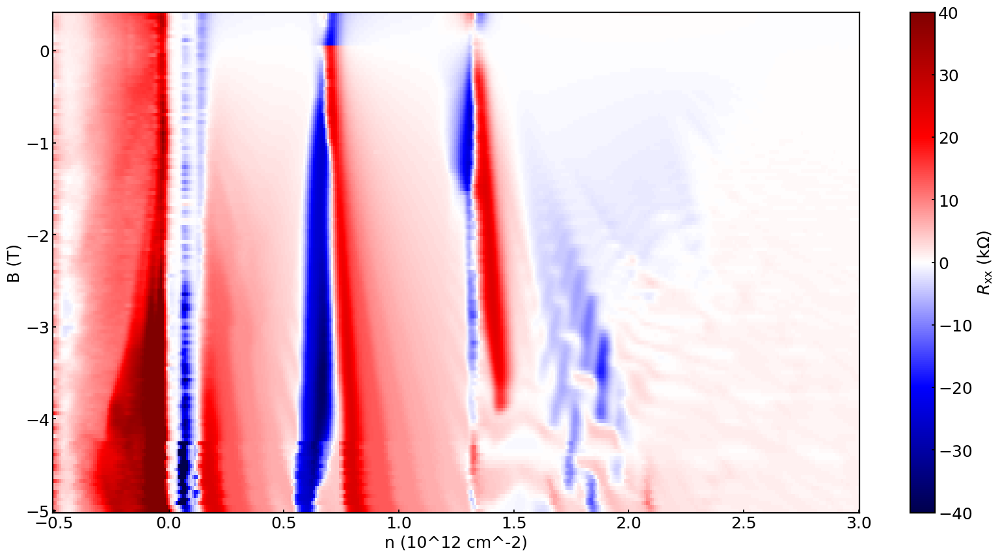

In [16]:
#plot Landau fan at 0.58V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][2]/1000/1e-9/1e3)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(-5, 0.4, num = len(database))

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# x15 = np.linspace(0.65, 0.722, 100)
# y15 = (x15 - 0.722)*(Phi_0*1e-2)*(-1)
# x16 = np.linspace(0.65, 0.722, 100)
# y16 = (x16 - 0.722)*(Phi_0*1e-2)*(1)

# x17 = np.linspace(0.67, 0.712, 100)
# y17 = (x17 - 0.712)*(Phi_0*1e-2)*(-3/2)
# x18 = np.linspace(0.67, 0.712, 100)
# y18 = (x18 - 0.712)*(Phi_0*1e-2)*(3/2)

# ax.plot(x15, y15, 'k--', linewidth=0.5)
# ax.plot(x16, y16, 'k--', linewidth=0.5)
# ax.plot(x17, y17, 'r--', linewidth=1)
# ax.plot(x18, y18, 'r--', linewidth=1)
# plt.title('0.58 V/nm')

# fname = './LFv=1figures/0p58vnm_rxy.png'
# plt.savefig(fname, bbox_inches = 'tight')

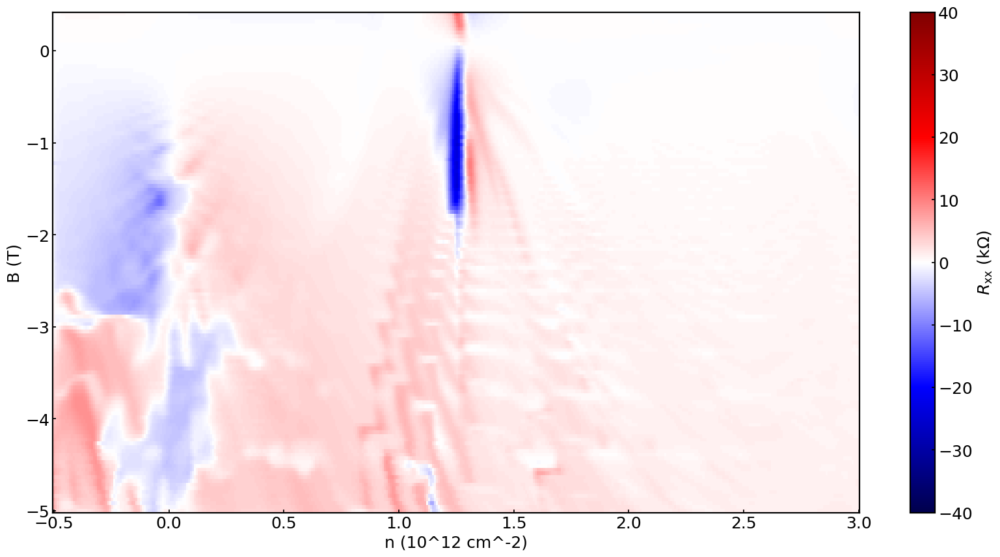

In [30]:
#plot Landau fan at 0.58V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][0]/1000/1e-9/1e3)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(-5, 0.4, num = len(database))

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# x15 = np.linspace(0.65, 0.722, 100)
# y15 = (x15 - 0.722)*(Phi_0*1e-2)*(-1)
# x16 = np.linspace(0.65, 0.722, 100)
# y16 = (x16 - 0.722)*(Phi_0*1e-2)*(1)

# x17 = np.linspace(0.67, 0.712, 100)
# y17 = (x17 - 0.712)*(Phi_0*1e-2)*(-3/2)
# x18 = np.linspace(0.67, 0.712, 100)
# y18 = (x18 - 0.712)*(Phi_0*1e-2)*(3/2)

# ax.plot(x15, y15, 'k--', linewidth=0.5)
# ax.plot(x16, y16, 'k--', linewidth=0.5)
# ax.plot(x17, y17, 'r--', linewidth=1)
# ax.plot(x18, y18, 'r--', linewidth=1)
# plt.title('0.58 V/nm')

# fname = './LFv=1figures/0p58vnm_rxy.png'
# plt.savefig(fname, bbox_inches = 'tight')

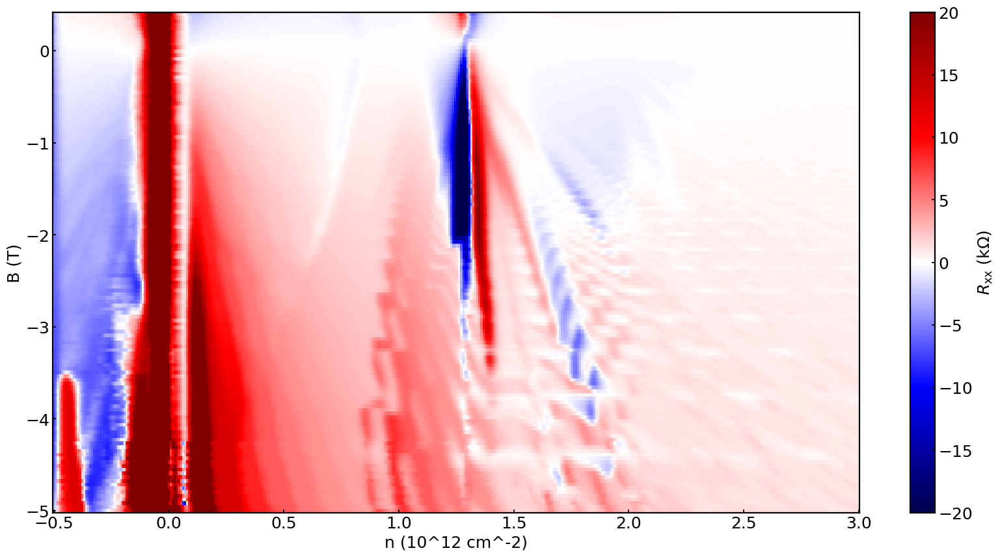

In [33]:
#plot Landau fan at 0.58V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][1]/1000/1e-9/1e3)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(-5, 0.4, num = len(database))

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -20, vmax = 20)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# x15 = np.linspace(0.65, 0.722, 100)
# y15 = (x15 - 0.722)*(Phi_0*1e-2)*(-1)
# x16 = np.linspace(0.65, 0.722, 100)
# y16 = (x16 - 0.722)*(Phi_0*1e-2)*(1)

# x17 = np.linspace(0.67, 0.712, 100)
# y17 = (x17 - 0.712)*(Phi_0*1e-2)*(-3/2)
# x18 = np.linspace(0.67, 0.712, 100)
# y18 = (x18 - 0.712)*(Phi_0*1e-2)*(3/2)

# ax.plot(x15, y15, 'k--', linewidth=0.5)
# ax.plot(x16, y16, 'k--', linewidth=0.5)
# ax.plot(x17, y17, 'r--', linewidth=1)
# ax.plot(x18, y18, 'r--', linewidth=1)
# plt.title('0.58 V/nm')

# fname = './LFv=1figures/0p58vnm_rxy.png'
# plt.savefig(fname, bbox_inches = 'tight')

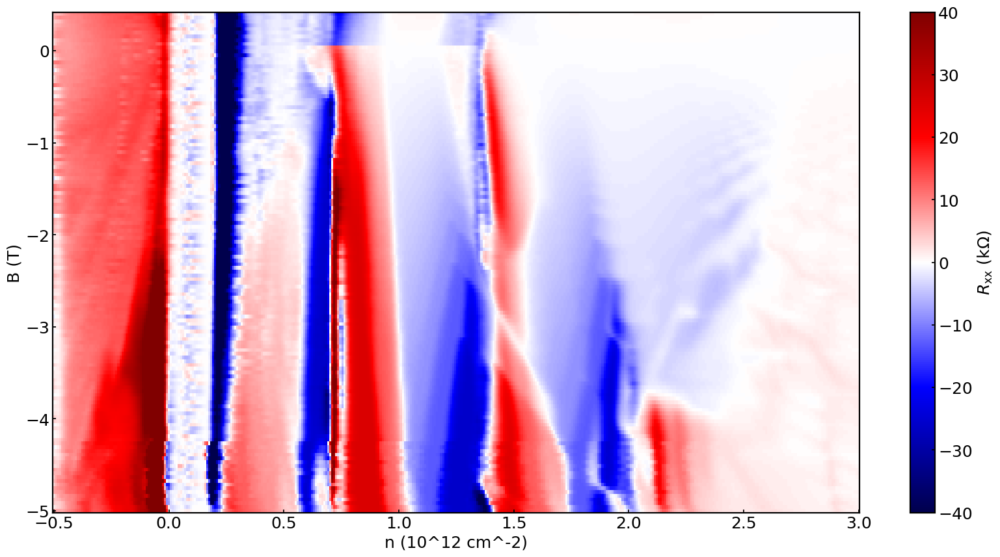

In [36]:
#plot Landau fan at 0.58V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][3]/1000/1e-9/1e3)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(-5, 0.4, num = len(database))

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -40, vmax = 40)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

# x15 = np.linspace(0.65, 0.722, 100)
# y15 = (x15 - 0.722)*(Phi_0*1e-2)*(-1)
# x16 = np.linspace(0.65, 0.722, 100)
# y16 = (x16 - 0.722)*(Phi_0*1e-2)*(1)

# x17 = np.linspace(0.67, 0.712, 100)
# y17 = (x17 - 0.712)*(Phi_0*1e-2)*(-3/2)
# x18 = np.linspace(0.67, 0.712, 100)
# y18 = (x18 - 0.712)*(Phi_0*1e-2)*(3/2)

# ax.plot(x15, y15, 'k--', linewidth=0.5)
# ax.plot(x16, y16, 'k--', linewidth=0.5)
# ax.plot(x17, y17, 'r--', linewidth=1)
# ax.plot(x18, y18, 'r--', linewidth=1)
# plt.title('0.58 V/nm')

# fname = './LFv=1figures/0p58vnm_rxy.png'
# plt.savefig(fname, bbox_inches = 'tight')

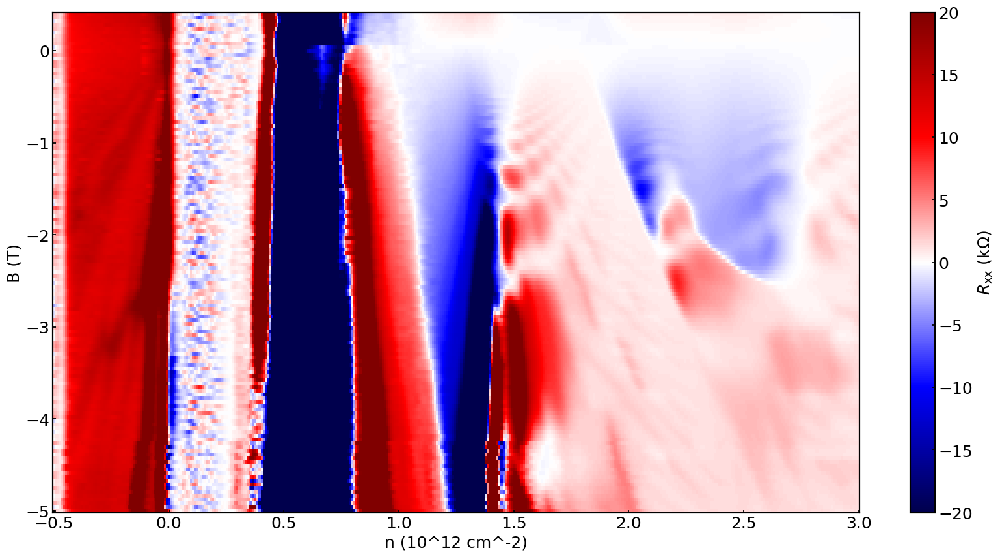

In [53]:
#plot Landau fan at 0.58V/nm, rxy

r_gd_x_2D = []
for i in range(0, len(database)):
    r_gd_x_2D.append(database[i]['v_gd_x_2d'][4]/1000/1e-9/1e3)
    
D = 0.6
n = np.linspace(-0.5, 3, num = 400)
B = np.linspace(-5, 0.4, num = len(database))

ff = 2.54
v = (n/ff)*4

xv, yv = np.meshgrid(n, B)
xv_v, yv_v = np.meshgrid(v, B)

fig, ax = plt.subplots(figsize = (20, 10))

ax.set_ylabel('B (T)')
ax.set_xlabel('n (10^12 cm^-2)')

c = ax.pcolormesh(xv, yv, r_gd_x_2D, cmap = 'seismic', vmin = -20, vmax = 20)
fig.colorbar(c, ax=ax, label = '$R_\mathrm{xx}\ \mathrm{(k\Omega)}$')

x3 = np.linspace(0.63, 0.7, 100)
y3 = (x3 - 0.7)*(Phi_0*1e-2)*(3/2)

# x15 = np.linspace(0.65, 0.722, 100)
# y15 = (x15 - 0.722)*(Phi_0*1e-2)*(-1)
# x16 = np.linspace(0.65, 0.722, 100)
# y16 = (x16 - 0.722)*(Phi_0*1e-2)*(1)

# x17 = np.linspace(0.67, 0.712, 100)
# y17 = (x17 - 0.712)*(Phi_0*1e-2)*(-3/2)
# x18 = np.linspace(0.67, 0.712, 100)
# y18 = (x18 - 0.712)*(Phi_0*1e-2)*(3/2)

# ax.plot(x15, y15, 'k--', linewidth=0.5)
# ax.plot(x16, y16, 'k--', linewidth=0.5)
# ax.plot(x17, y17, 'r--', linewidth=1)
# ax.plot(x18, y18, 'r--', linewidth=1)
# plt.title('0.58 V/nm')

# fname = './LFv=1figures/0p58vnm_rxy.png'
# plt.savefig(fname, bbox_inches = 'tight')